In [1]:
from gaia_tools import query
import gaia_tools.load as gload
from astroquery.gaia import Gaia
import matplotlib
#matplotlib.use("AGG")
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.table import Table
import pyexcel
from astropy import units as u
from astropy.coordinates import SkyCoord

import sklearn
from sklearn import cluster
from astropy import units as u
from astropy.coordinates import SkyCoord
from matplotlib.patches import Circle
#from matplotlib import patches

%pylab inline

import pywt
from galpy.util import bovy_plot

from scipy import stats
from matplotlib import colors, ticker, cm


Created TAP+ (v1.0.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: False
	Port: 80
	SSL Port: 443
Populating the interactive namespace from numpy and matplotlib


In [46]:
#data = np.genfromtxt('n288_gaia.dat',
                     #skip_header=1,
                     #skip_footer=1,
#                     names=True,
#                     dtype=None,
#                     delimiter=','
#                    )
#print(data)

In [2]:
data = np.loadtxt('n288_gaia.dat')
shape(data)

(18600, 11)

In [3]:
data
data[:,0]

array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 1.8597e+04, 1.8598e+04,
       1.8599e+04])

In [3]:
data_pd = pd.DataFrame({'id': data[:,0], 'x': data[:,1], 'y': data[:,2], 'z': data[:,3],
                       'vx': data[:,4], 'vy': data[:,5], 'vy': data[:,6], 
                       'ra': data[:,7], 'dec':data[:,8], 'pmra': data[:,9], 'pmdec': data[:,10]})
data_pd

,dec,id,pmdec,pmra,ra,vx,vy,x,y,z
0,-23.397537,0.0,-4.912093,3.665006,6.975490,16.664787,46.187116,7.666215,0.831994,-7.931522
1,-20.342980,1.0,-4.720971,-4.044494,251.449024,-323.063124,106.663940,1.548449,-0.078223,1.858700
2,-26.433878,2.0,-5.758041,4.307762,14.034576,1.288921,66.530545,8.175171,0.000811,-6.957651
3,-26.399620,3.0,-5.781238,4.372171,14.164594,2.258824,66.791784,8.189082,-0.003534,-6.948902
4,-22.632532,4.0,-3.669719,3.132213,343.322312,56.455801,-59.430340,4.447346,2.592364,-8.620836
5,-38.675833,5.0,-7.703609,6.721005,293.037474,128.696462,-272.571709,1.019981,0.028608,-3.118009
6,-17.723815,6.0,-4.820255,4.273549,8.379526,28.371059,40.527490,8.214617,1.317963,-7.322661
7,-21.904225,7.0,-4.580015,6.037386,255.393973,-53.309263,-278.052902,0.160776,0.040931,1.689355
8,-30.379327,8.0,-4.239208,5.097824,345.320124,99.363331,-83.278148,4.844728,1.074895,-7.415758
9,-37.042888,9.0,-5.158288,5.684525,319.361818,100.847738,-183.088005,2.273793,0.649375,-5.615616


In [4]:
ra_n = data[:,7]
print(ra_n)
dec_n = data[:,8]
print(dec_n)
pmra_n = data[:,9]
print(pmra_n)
pmdec_n = data[:,10]
print(pmdec_n)

[  6.97549  251.449024  14.034576 ... 333.005495 336.678882  14.037011]
[-23.397537 -20.34298  -26.433878 ... -31.492511 -21.500019 -26.518679]
[ 3.665006 -4.044494  4.307762 ...  5.453205  2.862158  4.3657  ]
[-4.912093 -4.720971 -5.758041 ... -4.349176 -3.42119  -5.793267]


In [4]:
ra_n = data_pd.loc[:,"ra"]
#print(ra_n)
dec_n = data_pd.loc[:,"dec"]
#print(dec_n)
pmra_n = data_pd.loc[:,"pmra"]
#print(pmra_n)
pmdec_n = data_pd.loc[:,"pmdec"]
#print(pmdec_n)

In [5]:
# csv-pd set up for DBSCANN
GlobClust_Log_ra_dec = pd.read_csv('~/GlobClust_ra-dec.csv')
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[0:0,"r_t"]
GlobClust_Log_radec = GlobClust_Log_ra_dec.loc[0:0,"RA":"DEC"]
GlobClust_Log_ID = GlobClust_Log_ra_dec.loc[0:0,"ID"]
GlobClust_Log_r_c = GlobClust_Log_ra_dec.loc[0:0,"r_c"]
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[0:0,"r_t"]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')

GlobClust_Log_dec = coord_ra_dec.dec.deg
GlobClust_Log_ra = coord_ra_dec.ra.deg

In [6]:
pmra_n_norm = pmra_n-pmra_n[core_indx].mean()
pmdec_n_norm = pmdec_n-pmdec_n[core_indx].mean()
pmra_n[core_indx].mean()


NameError: name 'core_indx' is not defined

In [6]:
ra_n.mean()

156.25889517956986

In [7]:
core_indx = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) <= GlobClust_Log_r_c[0]/60)

tidal_indx = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) <= GlobClust_Log_r_t[0]/60)

tidal_indx_15 = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) <= GlobClust_Log_r_t[0]/60*15)

a = pmra_n[core_indx].dropna().min()
aa = pmra_n[core_indx].dropna().max()
b = pmdec_n[core_indx].dropna().min()
bb = pmdec_n[core_indx].dropna().max()
c = pmra_n[tidal_indx].dropna().min()
cc = pmra_n[tidal_indx].dropna().max()
d = pmdec_n[tidal_indx].dropna().min()
dd = pmdec_n[tidal_indx].dropna().max()

print('pmra core min: %.2f' % a)
print('pmra core max: %.2f' % aa)
print('pmdec core min: %.2f' % b)
print('pmdec core max: %.2f' % bb)
print('pmra tidal min: %.2f' % c)
print('pmra tidal max: %.2f' % cc)
print('pmdec tidal min: %.2f' % d)
print('pmdec tidal max: %.2f' % dd)
print('core count:', core_indx.sum())
print('tidal count:', tidal_indx.sum())


a = pmra_n[core_indx].dropna().min()-pmra_n[core_indx].dropna().mean()
aa = pmra_n[core_indx].dropna().max()-pmra_n[core_indx].dropna().mean()
b = pmdec_n[core_indx].dropna().min()-pmdec_n[core_indx].dropna().mean()
bb = pmdec_n[core_indx].dropna().max()-pmdec_n[core_indx].dropna().mean()
c = pmra_n[tidal_indx].dropna().min()-pmra_n[core_indx].dropna().mean()
cc = pmra_n[tidal_indx].dropna().max()-pmra_n[core_indx].dropna().mean()
d = pmdec_n[tidal_indx].dropna().min()-pmdec_n[core_indx].dropna().mean()
dd = pmdec_n[tidal_indx].dropna().max()-pmdec_n[core_indx].dropna().mean()


print('\npmra core min (mean subtracted): %.2f' % a)
print('pmra core max (mean subtracted): %.2f' % aa)
print('pmdec core min (mean subtracted): %.2f' % b)
print('pmdec core max (mean subtracted): %.2f' % bb)
print('pmra tidal min (mean subtracted): %.2f' % c)
print('pmra tidal max (mean subtracted): %.2f' % cc)
print('pmdec tidal min (mean subtracted): %.2f' % d)
print('pmdec tidal max (mean subtracted): %.2f' % dd)
print('core count:', core_indx.sum())
print('tidal count:', tidal_indx.sum())


#pmra_n[core_indx].dropna()
#GlobClust_Log_r_c[0]/60
#pmdec_n.dropna().min()


pmra core min: 4.25
pmra core max: 4.45
pmdec core min: -6.08
pmdec core max: -5.69
pmra tidal min: 4.25
pmra tidal max: 4.45
pmdec tidal min: -6.77
pmdec tidal max: -5.38
core count: 1483
tidal count: 4286

pmra core min (mean subtracted): -0.09
pmra core max (mean subtracted): 0.11
pmdec core min (mean subtracted): -0.30
pmdec core max (mean subtracted): 0.09
pmra tidal min (mean subtracted): -0.09
pmra tidal max (mean subtracted): 0.11
pmdec tidal min (mean subtracted): -0.99
pmdec tidal max (mean subtracted): 0.39
core count: 1483
tidal count: 4286


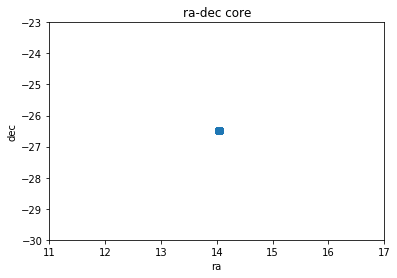

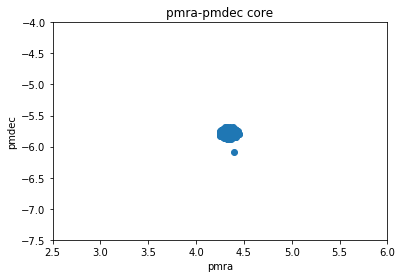

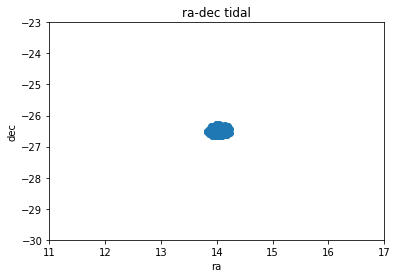

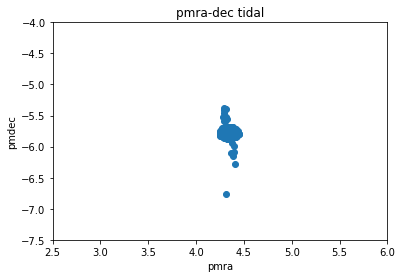

In [8]:
figure()
plt.scatter(ra_n[core_indx], dec_n[core_indx])
plt.gca().set_xlim([11,17])
plt.gca().set_ylim([-30,-23])
plt.title('ra-dec core')
plt.xlabel('ra')
plt.ylabel('dec')

figure()
plt.scatter(pmra_n[core_indx], pmdec_n[core_indx])
plt.gca().set_xlim([2.5,6])
plt.gca().set_ylim([-7.5,-4])
plt.title('pmra-pmdec core')
plt.xlabel('pmra')
plt.ylabel('pmdec')

figure()
plt.scatter(ra_n[tidal_indx], dec_n[tidal_indx])
plt.gca().set_xlim([11,17])
plt.gca().set_ylim([-30,-23])
plt.title('ra-dec tidal')
plt.xlabel('ra')
plt.ylabel('dec')

figure()
plt.scatter(pmra_n[tidal_indx], pmdec_n[tidal_indx])
plt.gca().set_xlim([2.5,6])
plt.gca().set_ylim([-7.5,-4])
plt.title('pmra-dec tidal')
plt.xlabel('pmra')
plt.ylabel('pmdec')

In [10]:
ra_n[tidal_indx3]

NameError: name 'tidal_indx3' is not defined

In [56]:
pmdec_n[tidal_indx].mean()
pmdec_n[tidal_indx3].mean()
pmdec_n[tidal_indx3].min()-pmdec_n[tidal_indx3].mean()
pmdec_n[tidal_indx3].max()-pmdec_n[tidal_indx3].mean()
pmra_n_norm[tidal_indx3].min()
pmra_n_norm[tidal_indx3].max()

5.3736180451786915

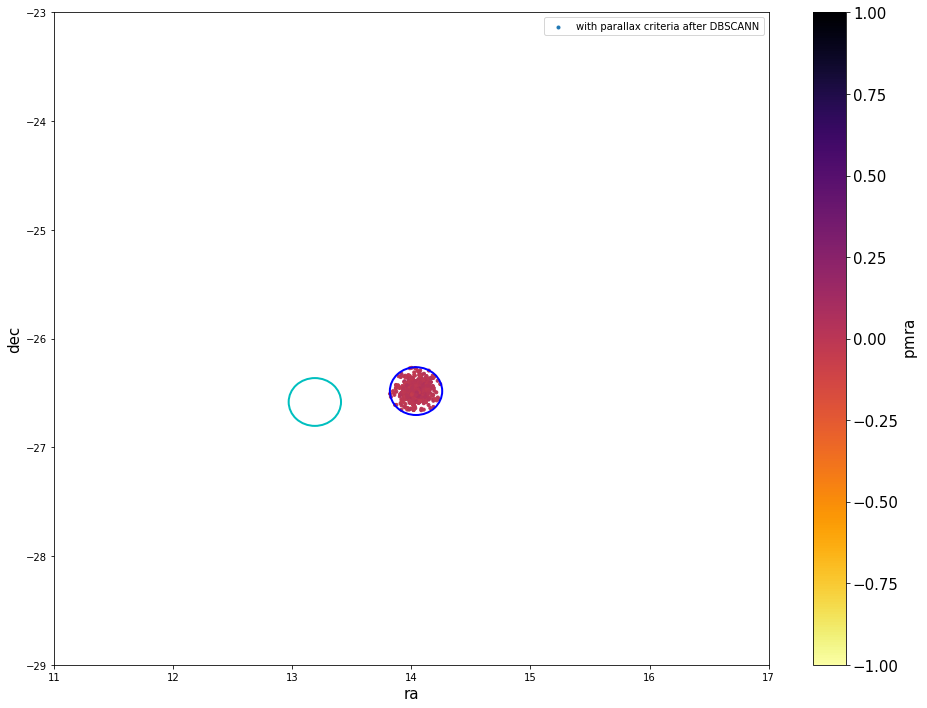

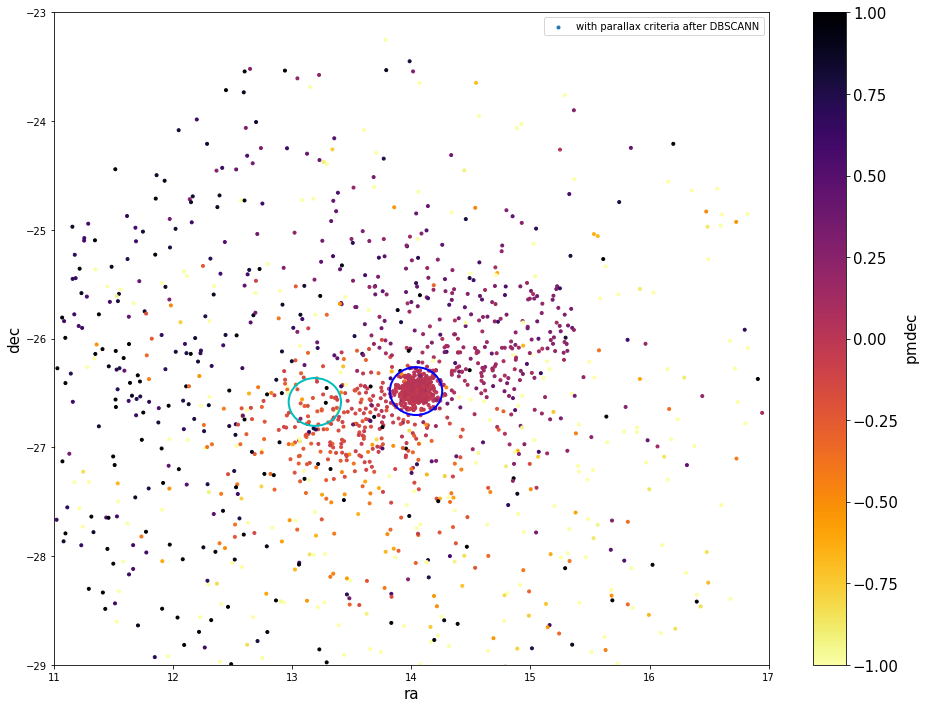

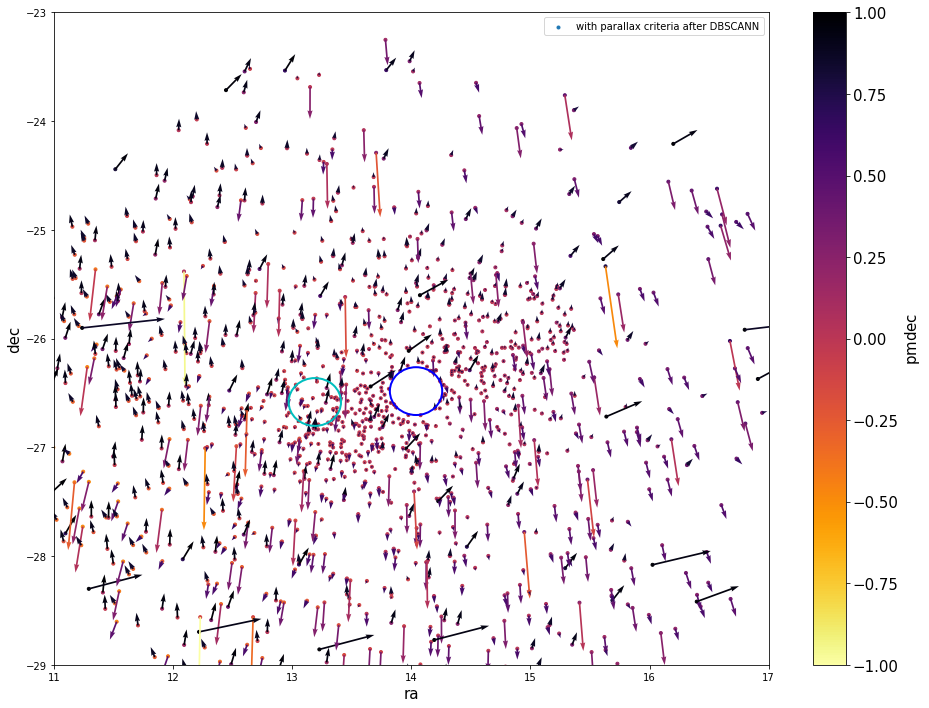

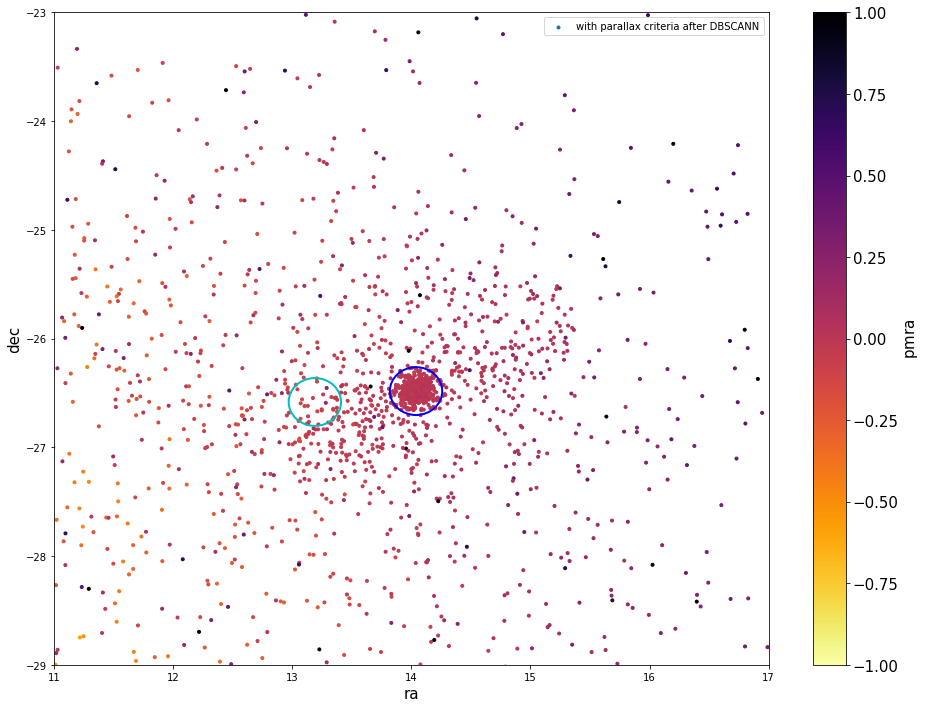

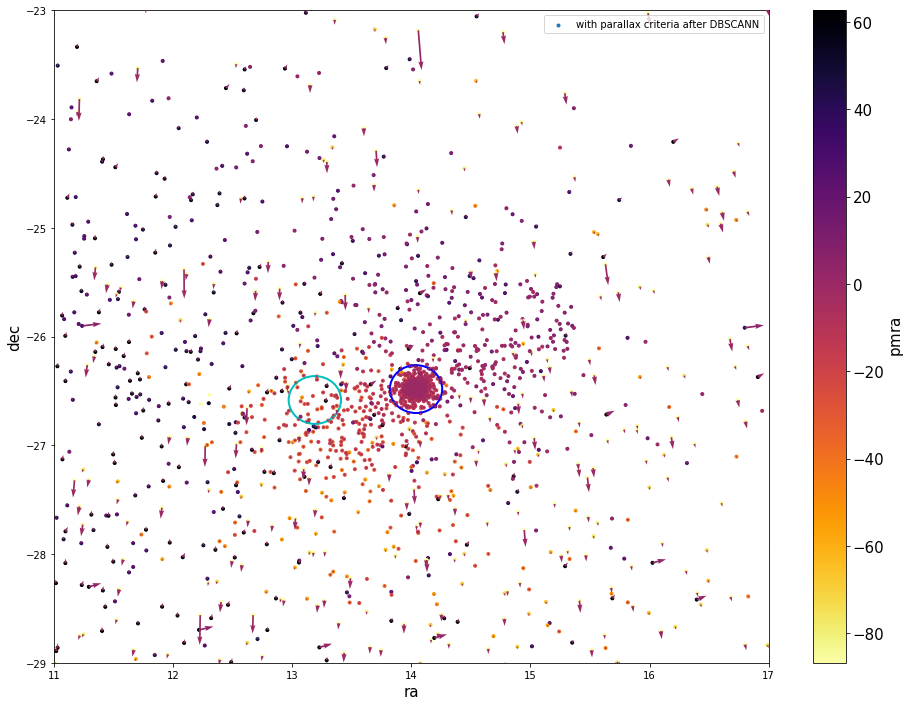

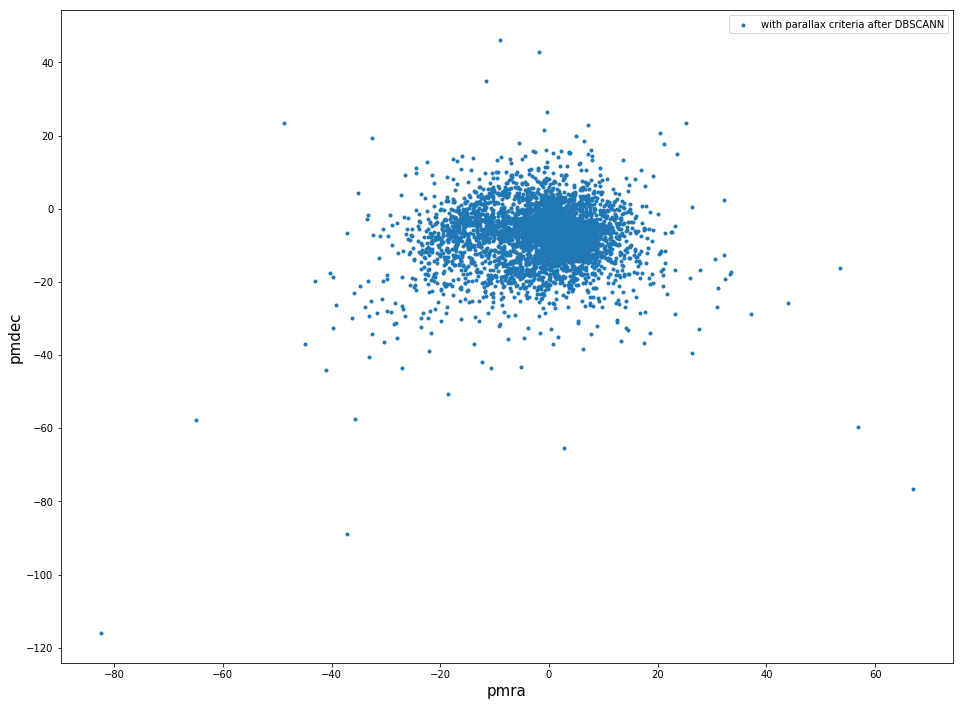

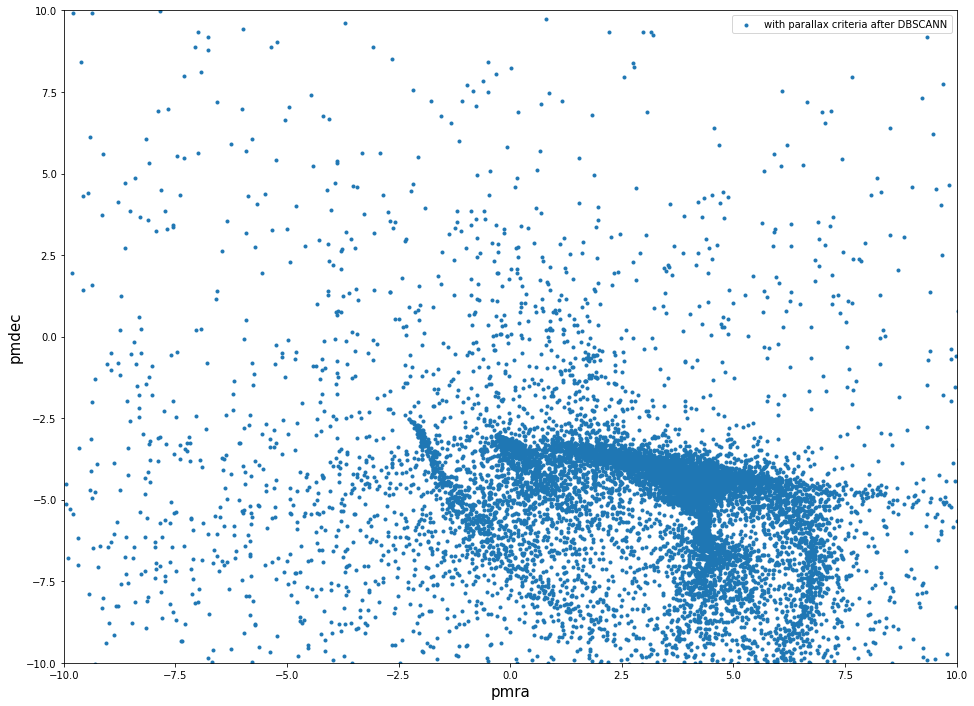

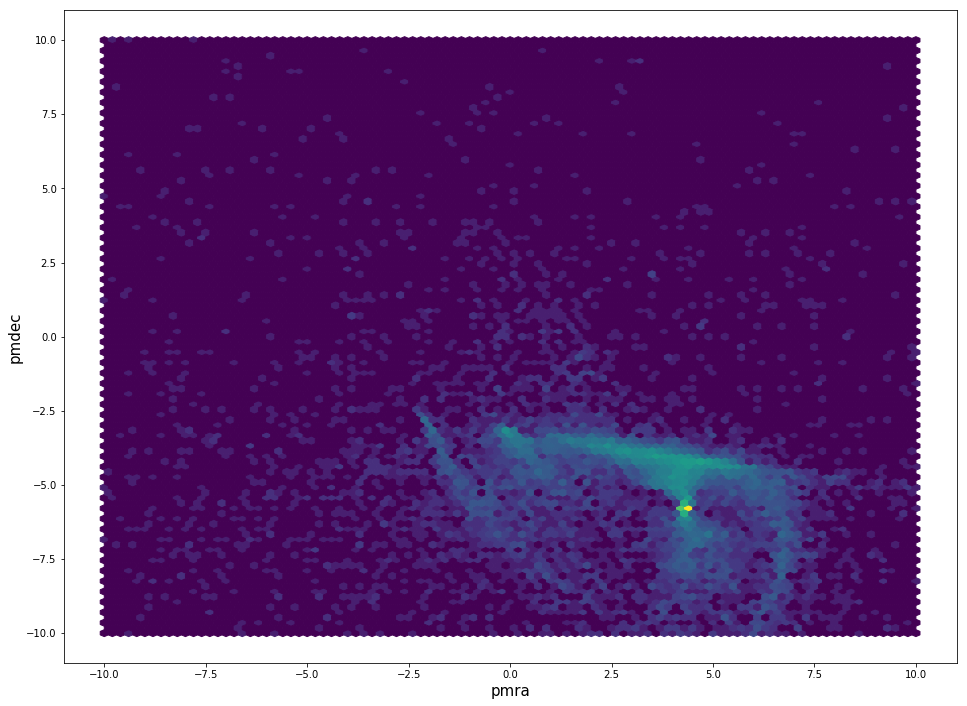

In [71]:
pmra_n_norm = pmra_n-pmra_n[core_indx].mean()
pmdec_n_norm = pmdec_n-pmdec_n[core_indx].mean()

tidal_indx3 = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) <= GlobClust_Log_r_t[0]/60*15) 

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_n-coord_ra_dec.ra.deg, dec_n-coord_ra_dec.dec.deg, c='c', alpha=0.2,marker ='.',label='original from DBSCANN' )
plt.scatter(ra_n[tidal_indx], dec_n[tidal_indx], c=pmra_n_norm[tidal_indx], cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_n[tidal_indx3], dec_n[tidal_indx3], c=pmdec_n_norm[tidal_indx3], cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()

clust_indx = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg+0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg+0.1)**2))>GlobClust_Log_r_t[0]/60)

a = ra_n.as_matrix()
b = dec_n.as_matrix()
aa = ra_n[tidal_indx2].as_matrix()
bb = dec_n[tidal_indx2].as_matrix()
c = pmra_n_norm.as_matrix()#*cos(pmra_DB_norm.as_matrix()[:,0])
d = pmdec_n_norm.as_matrix()#*sin(pmdec_DB_norm.as_matrix()[:,0])
cc = pmra_n_norm[tidal_indx2].as_matrix()#*cos(pmra_DB_norm.as_matrix()[:,0])
dd = pmdec_n_norm[tidal_indx2].as_matrix()#*sin(pmdec_DB_norm.as_matrix()[:,0])

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
sc=plt.scatter(ra_n[tidal_indx2], dec_n[tidal_indx2], c=pmra_n_norm[tidal_indx2], cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
#plt.quiver(ra_n[tidal_indx2], dec_n[tidal_indx2], 
#           pmra_n_norm[tidal_indx2], pmdec_n_norm[tidal_indx2], 
#           pmdec_n_norm[tidal_indx2], 
#           cmap='inferno_r', angles='xy', scale_units='xy')
plt.quiver(aa,bb,cc,dd,dd, cmap='inferno_r', angles='xy', scale_units='xy')
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar(sc)
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()


fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_n, dec_n, c=pmra_n_norm, cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_n, dec_n, c=pmdec_n_norm, cmap='inferno_r',marker ='.',
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
plt.quiver(ra_n[clust_indx], dec_n[clust_indx], pmra_n_norm[clust_indx], pmdec_n_norm[clust_indx], pmra_n_norm[clust_indx], 
           cmap='inferno_r', scale=1/0.005, zorder=5)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(pmra_n, pmdec_n,marker ='.',label='with parallax criteria after DBSCANN')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=2)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
#ax.add_artist(circle)
#ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('pmra', fontsize=15)
plt.ylabel('pmdec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([-10,10])
#plt.gca().set_xlim([-10,10])
plt.legend()
plt.show()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(pmra_n, pmdec_n,marker ='.',label='with parallax criteria after DBSCANN')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=2)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
#ax.add_artist(circle)
#ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('pmra', fontsize=15)
plt.ylabel('pmdec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-10,10])
plt.gca().set_xlim([-10,10])
plt.legend()
plt.show()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.hexbin(pmra_n, pmdec_n, gridsize=100, bins='log', extent=[-10,10,  -10,10])#,marker ='.',label='with parallax criteria after DBSCANN')
#plt.title('eps=0.031, min samps=18')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('pmra', fontsize=15)
plt.ylabel('pmdec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([-10,10])
#plt.gca().set_xlim([-10,10])
#plt.legend()
plt.show()

In [225]:
coord_ra_dec.dec.deg-0.1
GlobClust_Log_dec-0.1

array([-26.68261111])

In [78]:
pm_indx=(dec_n[tidal_indx2] < -26.68261)

In [112]:
np.rot90(ra_n[tidal_indx3][bot_indx], 1, (0,0))

ValueError: Axes must be different.

In [107]:
plt.scatter(np.rot90(ra_n[tidal_indx3][bot_indx], 1, 0), np.rot90(dec_n[tidal_indx3][bot_indx],1, 0))

TypeError: 'int' object is not iterable

In [242]:
shape(clust_indx)
shape(tidal_indx2)
shape(tidal_indx3)

(18600,)

In [10]:
tidal_indx2 = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) <= GlobClust_Log_r_t[0]/60*15) *\
    (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) > GlobClust_Log_r_t[0]/60)

theta = np.radians(-60)
c, s = np.cos(theta), np.sin(theta)
Rot = np.array(((c,-s), (s, c)))
print(Rot) 


[[ 0.5        0.8660254]
 [-0.8660254  0.5      ]]


In [11]:
ra_dec = pd.DataFrame({'ra': ra_n[tidal_indx2]-coord_ra_dec.ra.deg-0.85, 'dec': dec_n[tidal_indx2]-coord_ra_dec.dec.deg-0.1})
shape(ra_dec)
ra_dec.T
ra_dec_rot=ra_dec.dot(Rot)
#np.transpose([data_pd.loc[:,"ra"],data_pd.loc[:,"dec"]])*Rot 

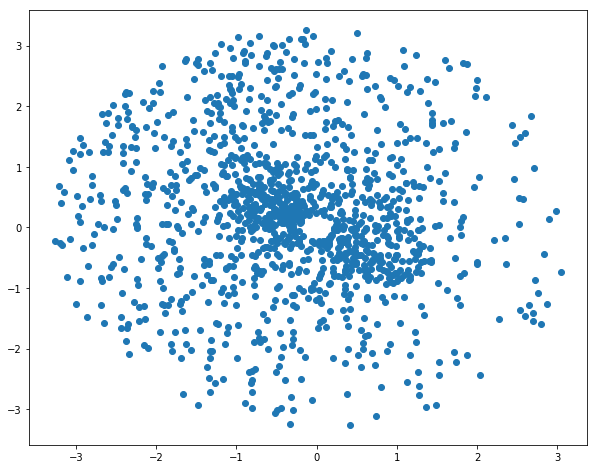

In [12]:
plt.figure(figsize=(10,8))
plt.scatter(ra_dec_rot.loc[:,1], ra_dec_rot.loc[:,0])

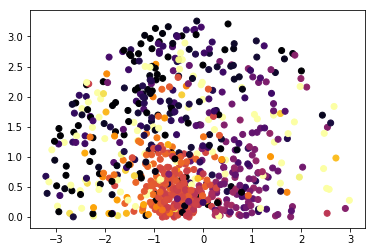

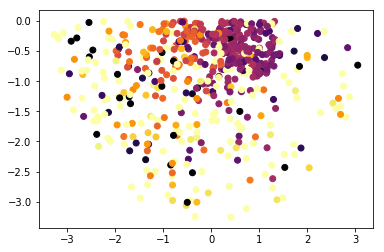

In [13]:
top_indx = (ra_dec_rot.loc[:,0] > 0)
bot_indx = (ra_dec_rot.loc[:,0] < 0)

plt.scatter(ra_dec_rot.loc[:,1][top_indx], ra_dec_rot.loc[:,0][top_indx], c=pmdec_n_norm[tidal_indx2][top_indx], cmap='inferno_r', vmin=-1, vmax=1)

fig=plt.figure()
plt.scatter(ra_dec_rot.loc[:,1][bot_indx], ra_dec_rot.loc[:,0][bot_indx], c=pmdec_n_norm[tidal_indx2][bot_indx], cmap='inferno_r', vmin=-1, vmax=1)



In [19]:
print(shape(R_clust), shape(pmdec_n))

NameError: name 'R_clust' is not defined

In [14]:
R_clust = np.sqrt((np.fabs(ra_dec_rot.loc[:,0]))**2+(np.fabs(ra_dec_rot.loc[:,1])**2))

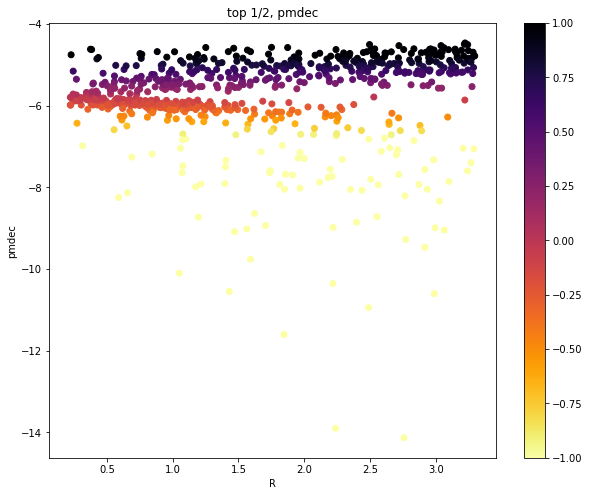

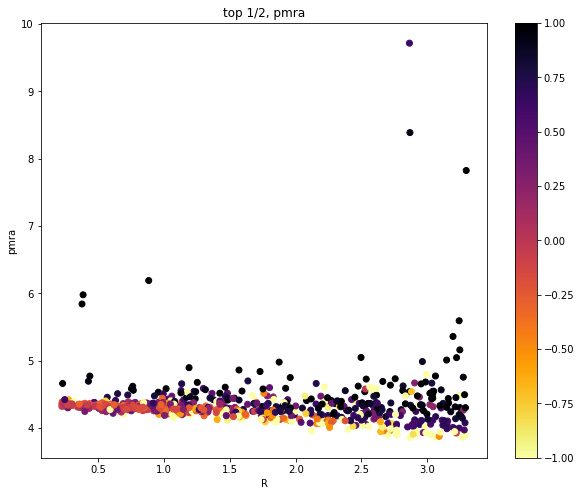

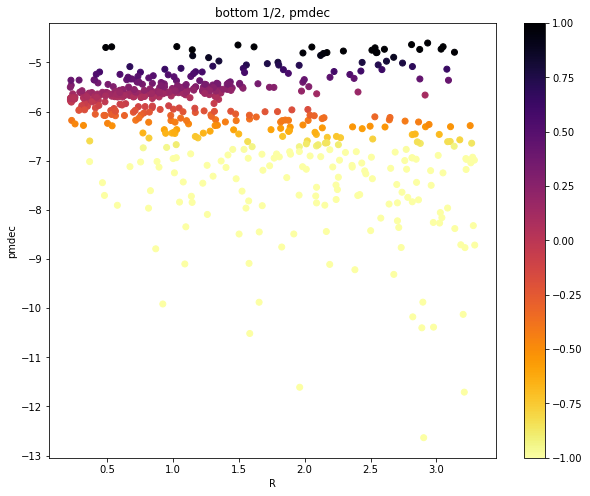

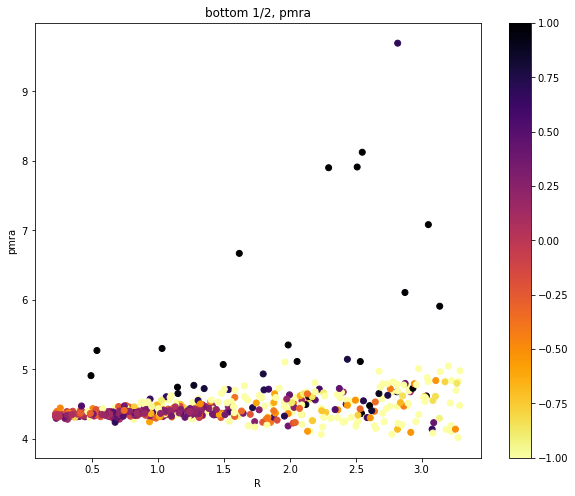

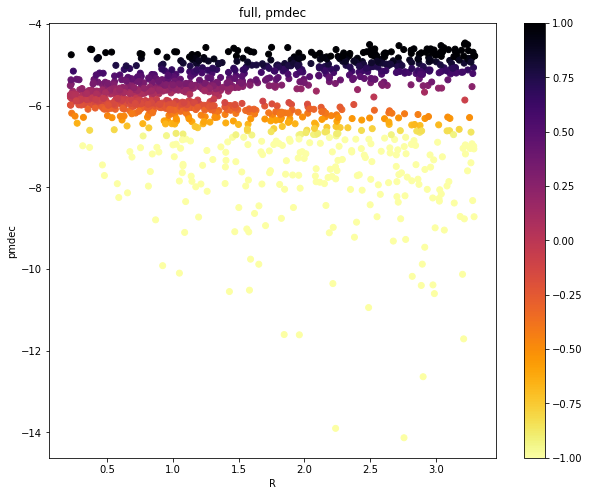

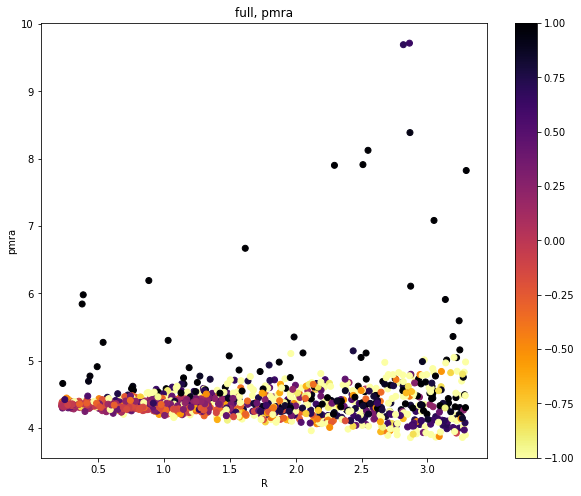

In [15]:
plt.figure(figsize=(10,8))
plt.scatter(R_clust[top_indx], pmdec_n[tidal_indx2][top_indx], c=pmdec_n_norm[tidal_indx2][top_indx], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('top 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust[top_indx], pmra_n[tidal_indx2][top_indx], c=pmdec_n_norm[tidal_indx2][top_indx], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('top 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust[bot_indx], pmdec_n[tidal_indx2][bot_indx], c=pmdec_n_norm[tidal_indx2][bot_indx], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('bottom 1/2, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust[bot_indx], pmra_n[tidal_indx2][bot_indx], c=pmdec_n_norm[tidal_indx2][bot_indx], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('bottom 1/2, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

plt.figure(figsize=(10,8))
plt.scatter(R_clust, pmdec_n[tidal_indx2], c=pmdec_n_norm[tidal_indx2], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('full, pmdec')
plt.xlabel('R')
plt.ylabel('pmdec')

plt.figure(figsize=(10,8))
plt.scatter(R_clust, pmra_n[tidal_indx2], c=pmdec_n_norm[tidal_indx2], cmap='inferno_r', vmin=-1, vmax=1)
plt.colorbar()
plt.title('full, pmra')
plt.xlabel('R')
plt.ylabel('pmra')

In [16]:
tidal_indx2 = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) <= GlobClust_Log_r_t[0]/60*15) *\
    (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) > GlobClust_Log_r_t[0]/60)

dec_n_rand=np.random.choice(dec_n[tidal_indx2], size=231)
ra_n_rand=np.random.choice(ra_n[tidal_indx2], size=231)
pmdec_n_rand=np.random.choice(pmdec_n[tidal_indx2], size=231)
pmra_n_rand=np.random.choice(pmra_n[tidal_indx2], size=231)
pmdec_n_norm_rand=np.random.choice(pmdec_n_norm[tidal_indx2], size=231)
pmra_n_norm_rand=np.random.choice(pmra_n_norm[tidal_indx2], size=231)

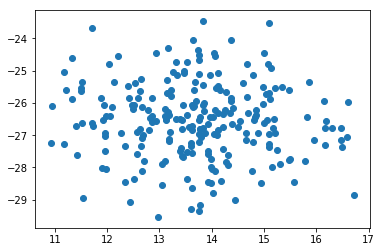

In [17]:
plt.scatter(ra_n_rand, dec_n_rand)

In [18]:
shape(ra_n_rand)
shape(dec_n[tidal_indx2])

(1272,)

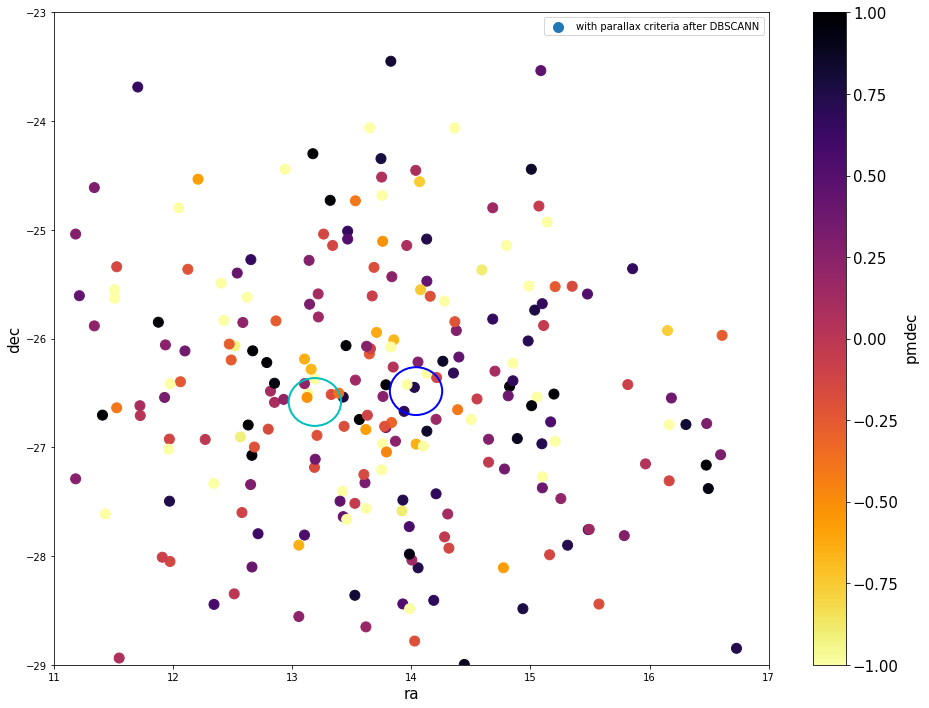

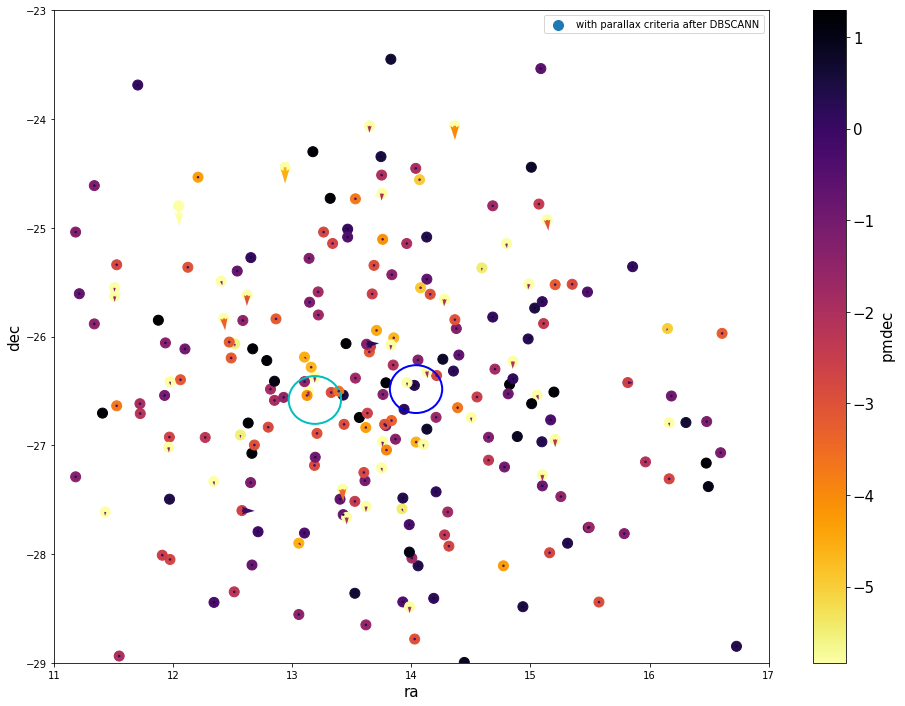

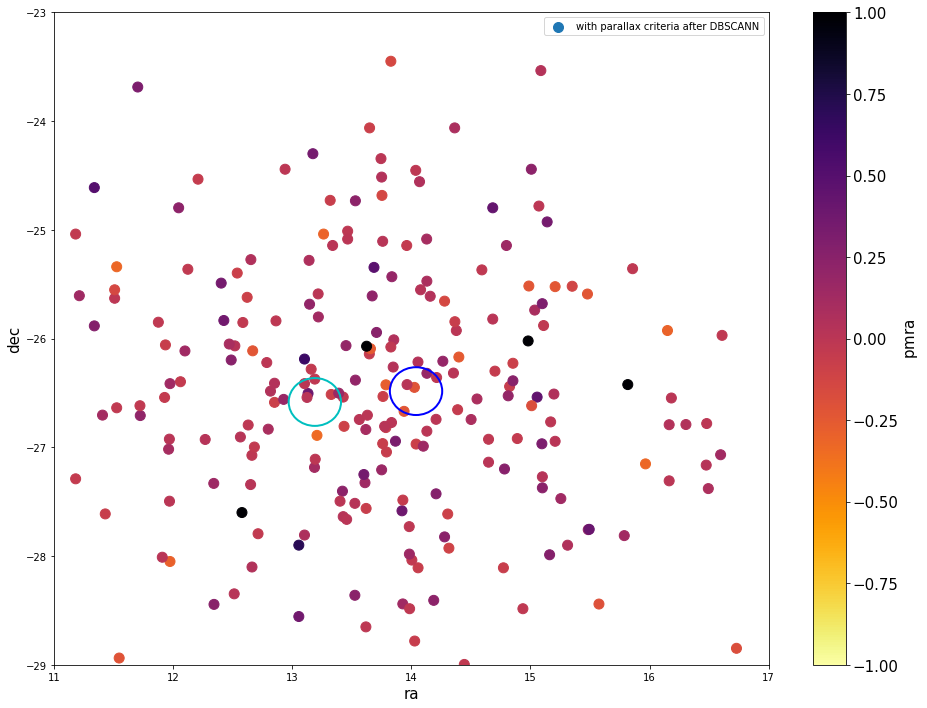

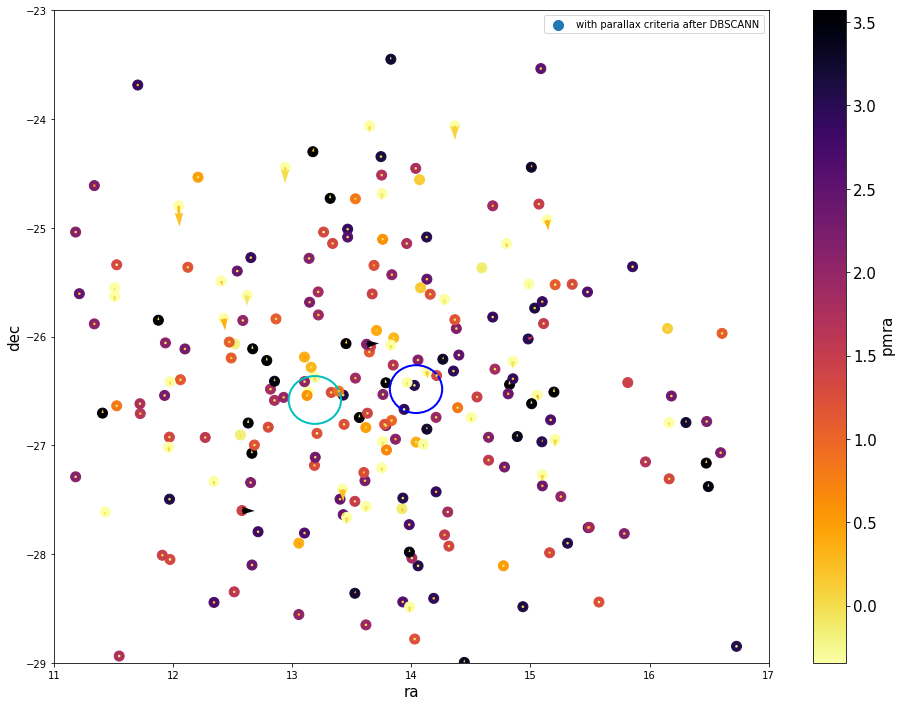

In [19]:
fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_n_rand, dec_n_rand, c=pmdec_n_norm_rand, cmap='inferno_r',marker ='o', s=100,
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()

clust_indx2 = (np.sqrt((np.fabs(ra_n_rand-coord_ra_dec.ra.deg+0.85)**2+\
                       np.fabs(dec_n_rand-coord_ra_dec.dec.deg+0.1)**2))>GlobClust_Log_r_t[0]/60)

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_n_rand, dec_n_rand, c=pmdec_n_norm_rand, cmap='inferno_r',marker ='o', s=100,
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2) 
plt.quiver(ra_n_rand[clust_indx2], dec_n_rand[clust_indx2], pmra_n_norm_rand[clust_indx2], pmdec_n_norm_rand[clust_indx2], pmdec_n_norm_rand[clust_indx2], 
           cmap='inferno_r', scale=1/0.005, zorder=5)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()


fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_n_rand, dec_n_rand, c=pmra_n_norm_rand, cmap='inferno_r',marker ='o', s=100,
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_n_rand, dec_n_rand, c=pmdec_n_norm_rand, cmap='inferno_r',marker ='o', s=100,
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=2)
ax.add_artist(circle)
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle2)
plt.quiver(ra_n_rand[clust_indx2], dec_n_rand[clust_indx2], pmra_n_norm_rand[clust_indx2], pmdec_n_norm_rand[clust_indx2], pmra_n_norm_rand[clust_indx2], 
           cmap='inferno_r', scale=1/0.005, zorder=5)
#plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
plt.gca().set_ylim([-29,-23])
plt.gca().set_xlim([11,17])
plt.legend()
plt.show()


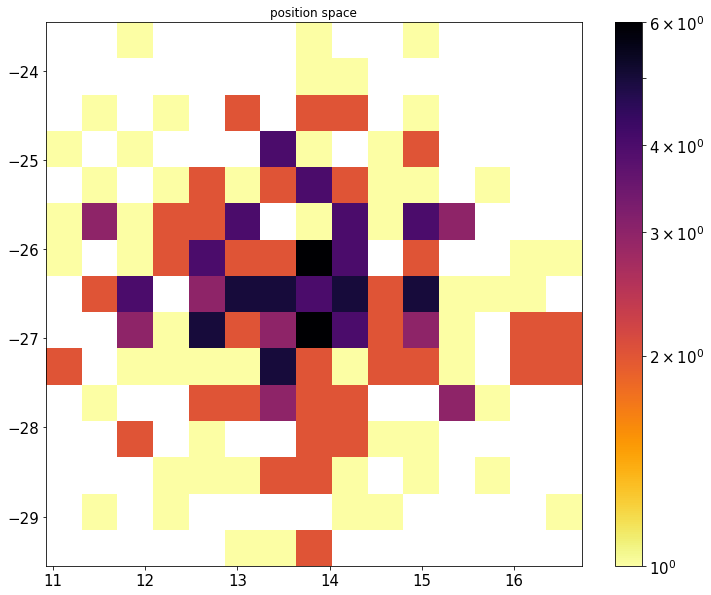

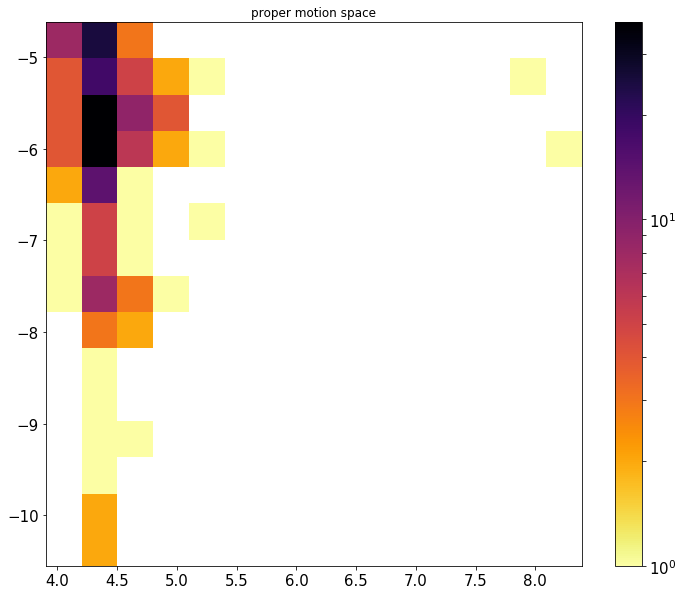

In [24]:
from scipy import stats
from matplotlib import colors, ticker, cm

fig=plt.figure(figsize=(12,10))
[h, xedges, yedges, image]=plt.hist2d(ra_n_rand,dec_n_rand, 
                            bins=(15,15), # C=pmdec_DB.dropna().loc[:,"pmdec"],
                                     cmap='inferno_r', norm=colors.LogNorm())#, norm=colors.LogNormalize()) 
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
plt.gca().tick_params(labelsize=15)
plt.title('position space')
#plt.gca().set_ylim([-26.65,-26.50])
#plt.gca().set_xlim([13.10,13.25])
plt.show()

fig=plt.figure(figsize=(12,10))
[h, xedges, yedges, image]=plt.hist2d(pmra_n_rand,pmdec_n_rand, 
                            bins=(15,15),
                            cmap='inferno_r', norm=colors.LogNorm()) 
                                      #norm=colors.LogNormalize())#vmin=GlobClust_Log_ra_out.min(), vmax=GlobClust_Log_ra_out.max()))#, normed=True)#, cmin=5, cmax=20)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
plt.gca().tick_params(labelsize=15)
plt.title('proper motion space')
#plt.gca().set_ylim([-26.65,-26.50])
#plt.gca().set_xlim([13.10,13.25])
plt.show()

In [ ]:
shape(tidal_indx2)

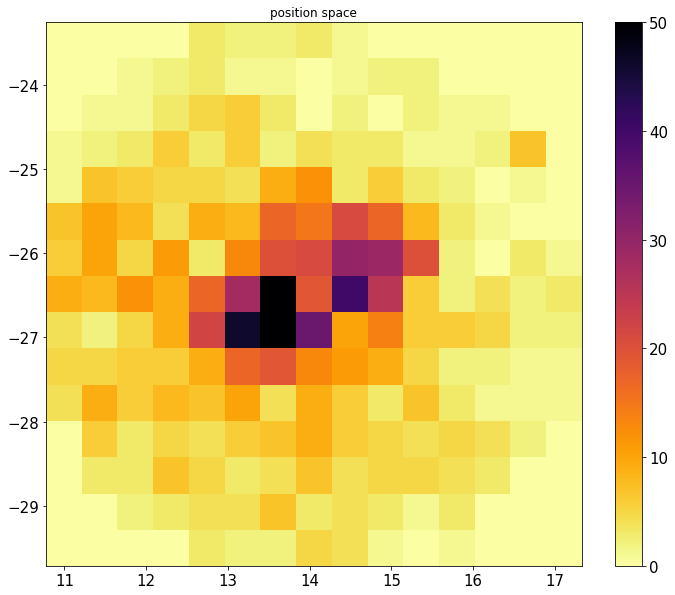

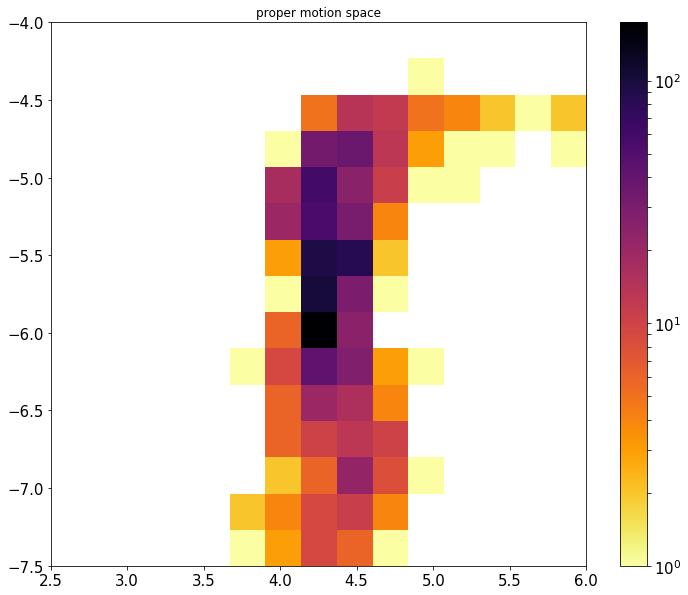

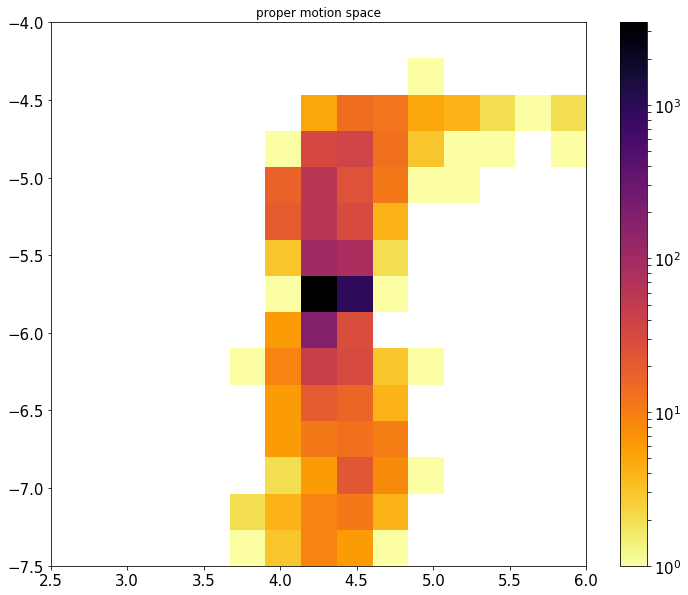

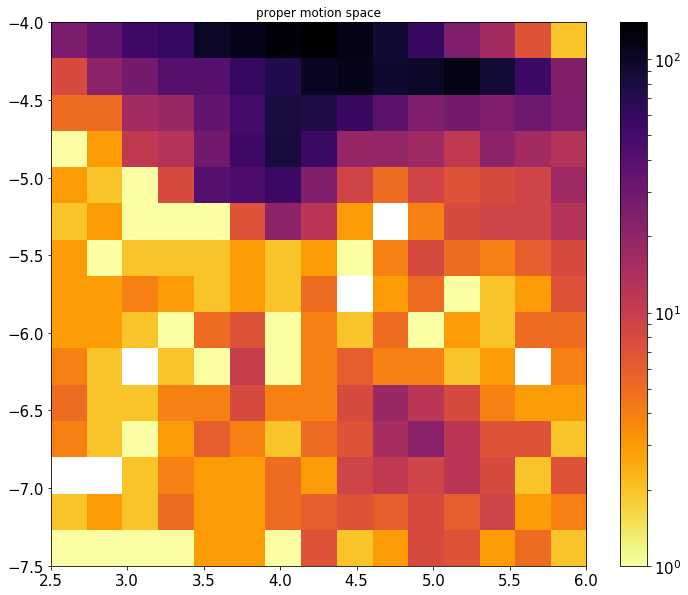

In [42]:
from scipy import stats
from matplotlib import colors, ticker, cm

fig=plt.figure(figsize=(12,10))
[h, xedges, yedges, image]=plt.hist2d(ra_n[tidal_indx2],dec_n[tidal_indx2], 
                            bins=(15,15), # C=pmdec_DB.dropna().loc[:,"pmdec"],
                                     cmap='inferno_r', )#norm=colors.LogNorm())#, norm=colors.LogNormalize()) 
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
plt.gca().tick_params(labelsize=15)
plt.title('position space')
#plt.gca().set_ylim([-26.65,-26.50])
#plt.gca().set_xlim([13.10,13.25])
plt.show()

fig=plt.figure(figsize=(12,10))
[h, xedges, yedges, image]=plt.hist2d(pmra_n[tidal_indx2].dropna(),pmdec_n[tidal_indx2].dropna(), 
                            bins=(15,15),
                            cmap='inferno_r', norm=colors.LogNorm(), range=[[2.5,6], [-7.5,-4]]) 
                                      #norm=colors.LogNormalize())#vmin=GlobClust_Log_ra_out.min(), vmax=GlobClust_Log_ra_out.max()))#, normed=True)#, cmin=5, cmax=20)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
plt.gca().tick_params(labelsize=15)
plt.title('proper motion space')
#plt.gca().set_ylim([-26.65,-26.50])
#plt.gca().set_xlim([13.10,13.25])
plt.show()

fig=plt.figure(figsize=(12,10))
[h, xedges, yedges, image]=plt.hist2d(pmra_n[tidal_indx3].dropna(),pmdec_n[tidal_indx3].dropna(), 
                            bins=(15,15),
                            cmap='inferno_r', norm=colors.LogNorm(), range=[[2.5,6], [-7.5,-4]]) 
                                      #norm=colors.LogNormalize())#vmin=GlobClust_Log_ra_out.min(), vmax=GlobClust_Log_ra_out.max()))#, normed=True)#, cmin=5, cmax=20)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
plt.gca().tick_params(labelsize=15)
plt.title('proper motion space')
#plt.gca().set_ylim([-26.65,-26.50])
#plt.gca().set_xlim([13.10,13.25])
plt.show()


tidal_indx4 = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg-0.85)**2+\
                       np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg-0.1)**2)) > GlobClust_Log_r_t[0]/60*15)
fig=plt.figure(figsize=(12,10))
[h, xedges, yedges, image]=plt.hist2d(pmra_n[tidal_indx4].dropna(),pmdec_n[tidal_indx4].dropna(), 
                            bins=(15,15),
                            cmap='inferno_r', norm=colors.LogNorm(), range=[[2.5,6], [-7.5,-4]]) 
                                      #norm=colors.LogNormalize())#vmin=GlobClust_Log_ra_out.min(), vmax=GlobClust_Log_ra_out.max()))#, normed=True)#, cmin=5, cmax=20)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
plt.gca().tick_params(labelsize=15)
plt.title('proper motion space')
#plt.gca().set_ylim([-26.65,-26.50])
#plt.gca().set_xlim([13.10,13.25])
plt.show()

(-30, -23)

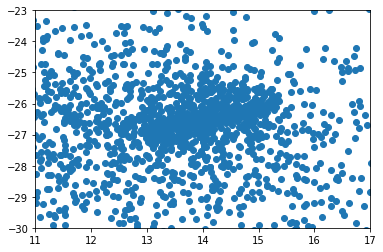

In [10]:
plt.scatter(ra_n, dec_n)
plt.gca().set_xlim([11,17])
plt.gca().set_ylim([-30,-23])


(-30, -23)

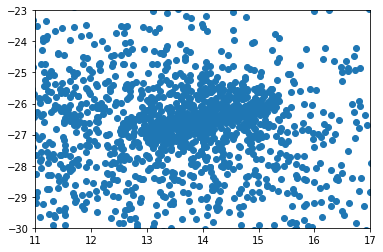

In [11]:
plt.scatter(ra_kde, dec_kde)
plt.gca().set_xlim([11,17])
plt.gca().set_ylim([-30,-23])


(-27.2, -26.8)

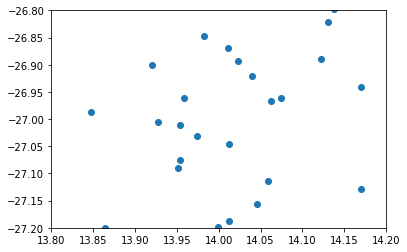

In [12]:
plt.scatter(ra_kde, dec_kde)
plt.gca().set_xlim([14-0.2,14+0.2,])
plt.gca().set_ylim([-27-0.2,-27+0.2,])

(-7.5, -4)

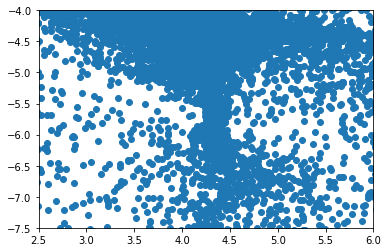

In [13]:
plt.scatter(pmra_kde, pmdec_kde)
plt.gca().set_xlim([2.5,6])
plt.gca().set_ylim([-7.5,-4])


(-7.5, -4)

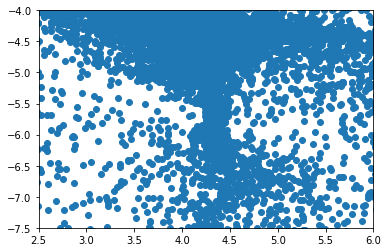

In [34]:
plt.scatter(pmra_n[clust_indx], pmdec_n[clust_indx])
plt.gca().set_xlim([2.5,6])
plt.gca().set_ylim([-7.5,-4])

5669
(5669,)
(5669,)
[0.    0.007 0.014 0.021 0.028 0.035 0.042 0.049 0.056 0.063 0.07  0.077
 0.084 0.091 0.098 0.105 0.112 0.119]


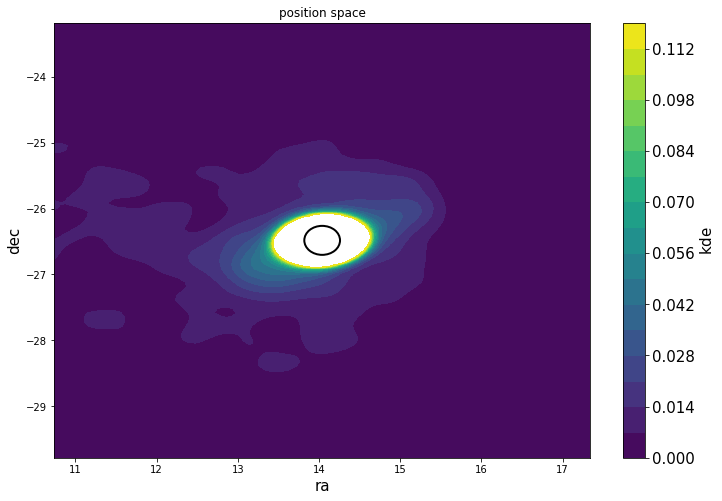

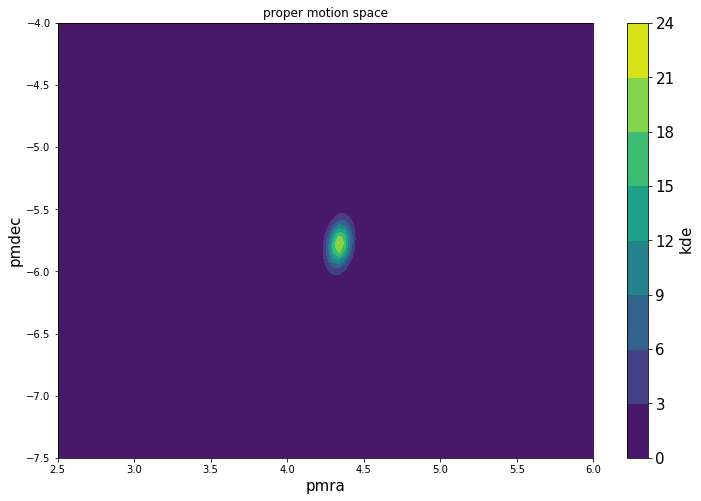

In [9]:
r_t = GlobClust_Log_r_t.as_matrix()
r_t = r_t[0]

#clust_indx = (np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg+0.85)**2\
#                       +np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg+0.1)**2))
#              >GlobClust_Log_r_t[0]/60)*\
clust_indx =(np.sqrt((np.fabs(ra_n.as_matrix()-coord_ra_dec.ra.deg+0.85)**2+np.fabs(dec_n.as_matrix()-coord_ra_dec.dec.deg+0.1)**2))
              <=GlobClust_Log_r_t[0]/60*15)

print(sum(clust_indx))

pmra_kde=pmra_n[clust_indx].as_matrix()
pmdec_kde=pmdec_n[clust_indx].as_matrix()
print(shape(pmdec_kde))
#pmra_kde=pmra_DB.as_matrix()
#pmdec_kde=pmdec_DB.as_matrix()

ra_kde=ra_n[clust_indx].as_matrix()
dec_kde=dec_n[clust_indx].as_matrix()
print(shape(pmdec_kde))

pmra_kde_1 = 0-10 
pmra_kde_2 = 0+10
pmdec_kde_1 = 0-10
pmdec_kde_2 = 0+10


findx=(np.isfinite(pmra_kde))*(np.isfinite(pmdec_kde))*(pmra_kde<pmra_kde_2)*(pmra_kde>pmra_kde_1)*(pmdec_kde>pmdec_kde_1)*(pmdec_kde<pmdec_kde_2)

from scipy import stats
from matplotlib import colors, ticker, cm

#pmra_kde=pmra_DB.as_matrix()[findx]
#pmdec_kde=pmdec_DB.as_matrix()[findx]

#pmra_kde=pmra_DB.dropna().as_matrix()
#pmdec_kde=pmdec_DB.dropna().as_matrix()

ra_kde_1 = coord_ra_dec.ra.deg+0.85-r_t/60*15
ra_kde_2 = coord_ra_dec.ra.deg+0.85+r_t/60*15
dec_kde_1 = coord_ra_dec.dec.deg+0.1-r_t/60*15
dec_kde_2 = coord_ra_dec.dec.deg+0.1+r_t/60*15

#KDE part
k = stats.gaussian_kde([ra_kde[findx], dec_kde[findx]], )
xi, yi = np.mgrid[ra_kde_1:ra_kde_2:100*1j, 
                  dec_kde_1:dec_kde_2:100*1j]
#print(xi,yi,k)
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
zii=zi.reshape(xi.shape)

contours = np.arange(0,0.126, 0.007)
print(contours)

fig=plt.figure(figsize=(12,8))
plt.contourf(xi, yi, zii ,levels=contours)#, locator=ticker.LogLocator())
circle2 = plt.Circle((coord_ra_dec.ra.deg+0.85, coord_ra_dec.dec.deg+0.1), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=2)
plt.gca().add_artist(circle2)
plt.title('position space')
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{kde}$',fontsize=15)
#plt.gca().set_xlim([])

#KDE part
k = stats.gaussian_kde([pmra_kde[findx], pmdec_kde[findx]], )
#xi, yi = np.mgrid[pmra_kde_1:pmra_kde_2:100*1j, 
#                  pmdec_kde_1:pmdec_kde_2:100*1j]
xi, yi = np.mgrid[2.5:6:100*1j, 
                  -7.5:-4:100*1j]
#print(xi,yi,k)
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
zii=zi.reshape(xi.shape)

fig=plt.figure(figsize=(12,8))
plt.contourf(xi, yi, zii )#, locator=ticker.LogLocator())
plt.title('proper motion space')
plt.xlabel('pmra', fontsize=15)
plt.ylabel('pmdec', fontsize=15)
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{kde}$',fontsize=15)

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in log10
  if __name__ == '__main__':

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in log10
  # Remove the CWD from sys.path while we load stuff.



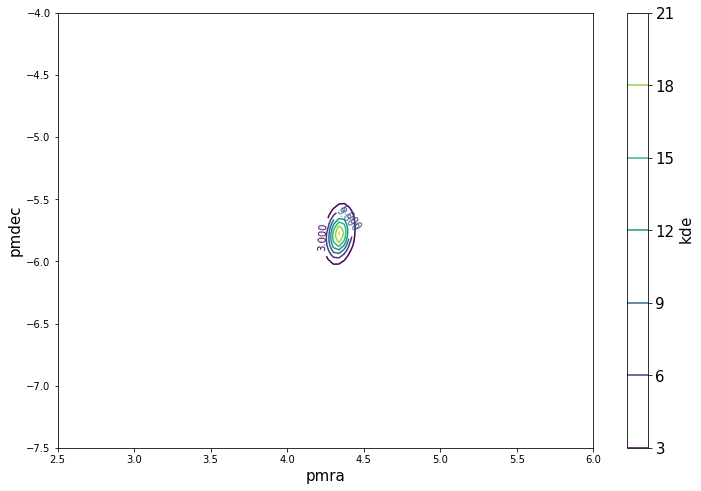

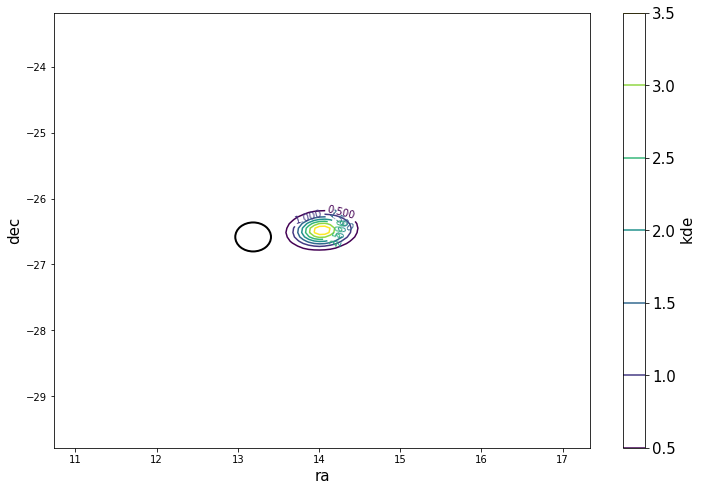

In [41]:
r_t = GlobClust_Log_r_t.as_matrix()
r_t = r_t[0]

#ra_kde_1 = 0-r_t/60*15
#ra_kde_2 = 0+r_t/60*15
#dec_kde_1 = 0-r_t/60*15
#dec_kde_2 = 0+r_t/60*15

lev_exp = np.arange(np.floor(np.log10(pmra_n_norm[~numpy.isnan(pmra_n_norm)]).min()-1),
                    np.ceil(np.log10(pmra_n_norm[~numpy.isnan(pmra_n_norm)]).max()+1))
levs = np.power(10, lev_exp)

#KDE part
k = stats.gaussian_kde([pmra_kde[findx], pmdec_kde[findx]], )
xi, yi = np.mgrid[2.5:6:100*1j, 
                  -7.5:-4:100*1j]
#print(xi,yi,k)
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
zii=zi.reshape(xi.shape)

fig=plt.figure(figsize=(12,8))
CS=plt.contour(xi, yi, zii, )# levs, norm=colors.LogNorm())#locator=ticker.LogLocator())
plt.xlabel('pmra', fontsize=15)
plt.ylabel('pmdec', fontsize=15)
plt.clabel(CS, inline=1, fontsize=10, )
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{kde}$',fontsize=15)

#KDE part
k = stats.gaussian_kde([ra_kde[findx], dec_kde[findx]], )
xi, yi = np.mgrid[ra_kde_1:ra_kde_2:100*1j, 
                  dec_kde_1:dec_kde_2:100*1j]
#print(xi,yi,k)
zi = k(np.vstack([xi.flatten(), yi.flatten()]))
zii=zi.reshape(xi.shape)

fig=plt.figure(figsize=(12,8))
CS=plt.contour(xi, yi, zii )#, levs, norm=colors.LogNorm())#locator=ticker.LogLocator())
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=2)
plt.gca().add_artist(circle2)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
plt.clabel(CS, inline=1, fontsize=10, )
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{kde}$',fontsize=15)

pmra_n: (18600,) 
 pmra norm a: (18600,)

 GC_pmradec_a 1: (4096, 32)
GC_pmradec: (18600, 2)

 GC_pmradec_a 2: (4096, 32)
(1213,)
(1213,)
(1213,)
(1213,)


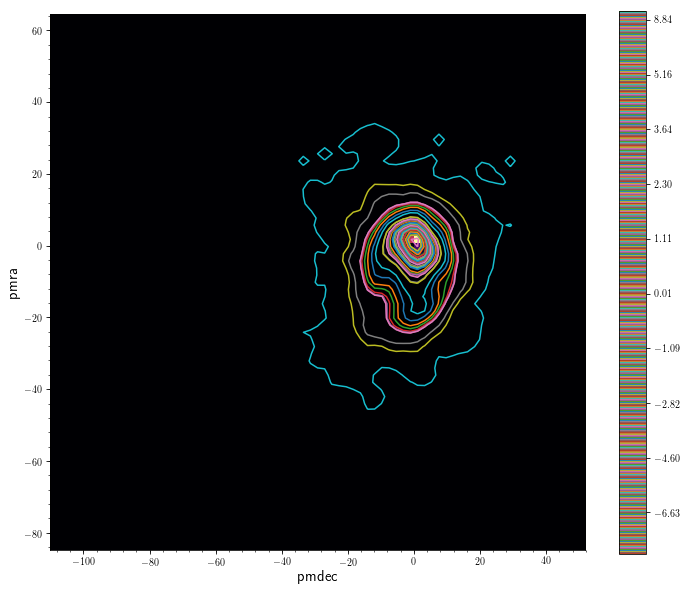

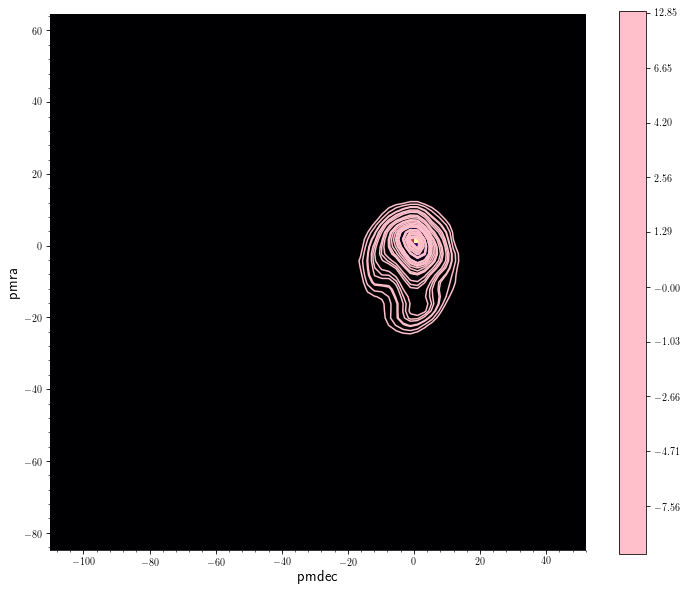

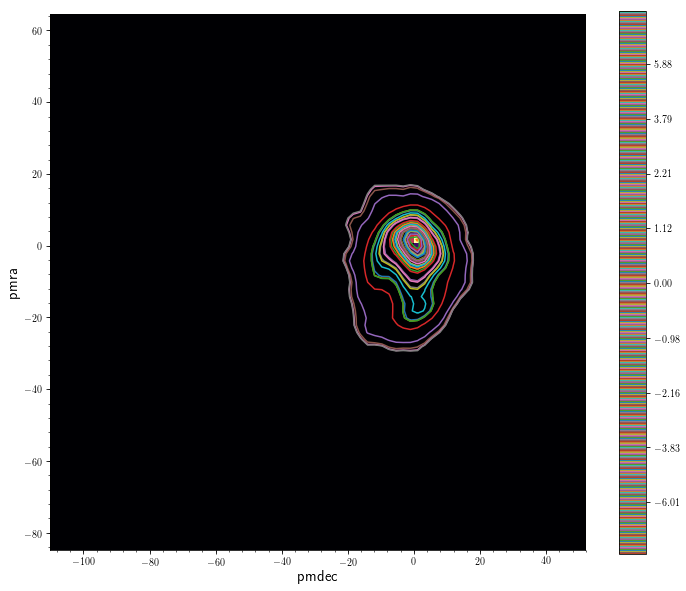

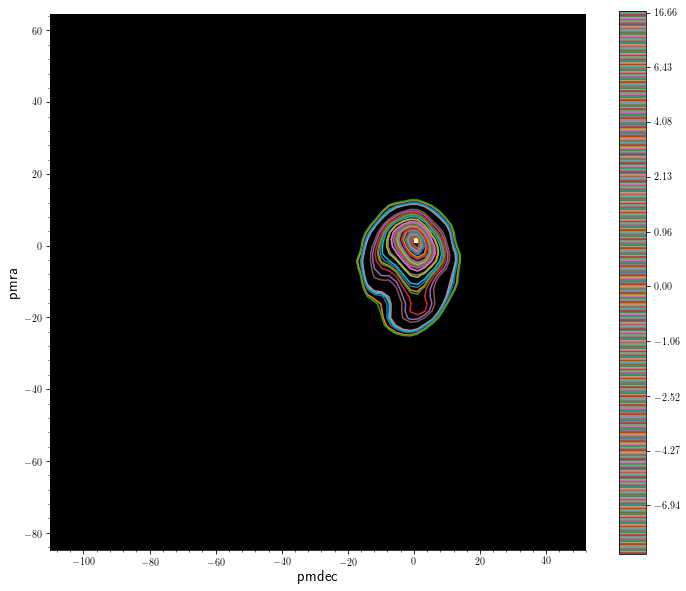

In [104]:
# Wavelet Transform plots for all 4 coefficients
# plots in proper motions

import pywt

pmra_n_norm_a = (pmra_n-pmra_n.mean())#.as_matrix()#/(pmra_DB.mean())
pmdec_n_norm_a = (pmdec_n-pmdec_n.mean())#.as_matrix()#/(pmra_DB.mean())

print('pmra_n:',shape(pmra_n), '\n pmra norm a:', shape(pmra_n_norm_a))

GC_pmradec = pd.DataFrame({'pmra': pmra_n_norm_a, 'pmdec': pmdec_n_norm_a})
#GC_pmradec=pmra_n_norm_a.join(pmdec_n_norm_a)
#GC_pmra = pmra_n_norm_a
#GC_pmdec = pmdec_n_norm_a
GC_pmradec_a = GC_pmradec.as_matrix()

#GC_pmradec_a = reshape(GC_pmradec.as_matrix(), (220,32))
#GC_pmradec_a = pad(GC_pmradec_a, [(4, 0), (0, 0)], 'mean')
GC_pmradec_a = pad(GC_pmradec_a, [(8, 0), (0, 0)], 'mean')
GC_pmradec_a = reshape(GC_pmradec_a, (1163,32))
GC_pmradec_a = pad(GC_pmradec_a, [(2933, 0), (0, 0)], 'mean')
#GC_pmradec_a = pad(GC_pmradec, [(1385, 0), (0, 0)], 'mean')
print('\n GC_pmradec_a 1:',shape(GC_pmradec_a))
#GC_pmradec_a = reshape(GC_pmradec_a, (256,32))
#GC_pmradec_a = reshape(GC_pmradec_a, (512,16))
#GC_pmradec_a = pad(GC_pmradec, [(1385, 0), (0, 0)], 'mean')
print('GC_pmradec:',shape(GC_pmradec))
print('\n GC_pmradec_a 2:',shape(GC_pmradec_a))

WT2 = pywt.swtn(GC_pmradec_a, 'db4', level=3, start_level=0)
WT2

WT2_aa=WT2[0].get("aa")[:,0]
WT2_aa=WT2_aa[~numpy.isnan(WT2_aa)]
WT2_aa.sort()
#print(WT2_aa)

WT2_ad=WT2[0].get("ad")[:,0]
WT2_ad=WT2_ad[~numpy.isnan(WT2_ad)]
WT2_ad.sort()
#print(WT2_ad)

WT2_da=WT2[0].get("da")[:,0]
WT2_da=WT2_da[~numpy.isnan(WT2_da)]
WT2_da.sort()
#print(WT2_da)

WT2_dd=WT2[0].get("dd")[:,0]
WT2_dd=WT2_dd[~numpy.isnan(WT2_dd)]
WT2_dd.sort()
#print(WT2_dd)

colours = arange(0.1,len(WT2_aa)+1,0.1)
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

WT_plus_aa = (np.diff(WT2_aa) != 0)#*(np.diff(WT2_aa)<0)
WT_plus_aa=np.append(WT_plus_aa, True)
print(shape(WT2_aa[WT_plus_aa]))
WT2_aa = WT2_aa[WT_plus_aa]
WT2_aa.sort()

WT_plus_ad = (np.diff(WT2_ad) != 0)#*(np.diff(WT2_aa)<0)
WT_plus_ad=np.append(WT_plus_ad, True)
print(shape(WT2_ad[WT_plus_ad]))
WT2_ad = WT2_ad[WT_plus_ad]
WT2_ad.sort()

WT_plus_da = (np.diff(WT2_da) != 0)#*(np.diff(WT2_aa)<0)
WT_plus_da=np.append(WT_plus_da, True)
print(shape(WT2_da[WT_plus_da]))
WT2_da = WT2_da[WT_plus_da]
WT2_da.sort()

WT_plus_dd = (np.diff(WT2_dd) != 0)#*(np.diff(WT2_aa)<0)
WT_plus_dd=np.append(WT_plus_dd, True)
print(shape(WT2_dd[WT_plus_dd]))
WT2_dd = WT2_dd[WT_plus_dd]
WT2_dd.sort()

fig=figure()
bovy_plot.bovy_print(fig_width=12, fig_height=10, )#axes_labelsize=16, text_fontsize=11, legend_fontsize=12, xtick_labelsize=10, ytick_labelsize=10, xtick_minor_size=2, ytick_minor_size=2, xtick_major_size=4, ytick_major_size=4)

# Proper Motion Space
bovy_plot.scatterplot(GC_pmradec["pmdec"].dropna().as_matrix(), GC_pmradec["pmra"].dropna().as_matrix(), 'w,',
                      cmap='inferno', cntrcolors=colors, levels=WT2_aa, bins=75, cntrSmooth=True)
cb=plt.colorbar()
plt.ylabel('pmra', fontsize=15)
plt.xlabel('pmdec', fontsize=15)

bovy_plot.scatterplot(GC_pmradec["pmdec"].dropna().as_matrix(), GC_pmradec["pmra"].dropna().as_matrix(), 'w,',
                      cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=75, cntrSmooth=True)
cb=plt.colorbar()
plt.ylabel('pmra', fontsize=15)
plt.xlabel('pmdec', fontsize=15)

bovy_plot.scatterplot(GC_pmradec["pmdec"].dropna().as_matrix(), GC_pmradec["pmra"].dropna().as_matrix(), 'w,',
                      cmap='inferno', cntrcolors=colors, levels=WT2_da, bins=75, cntrSmooth=True)
cb=plt.colorbar()
plt.ylabel('pmra', fontsize=15)
plt.xlabel('pmdec', fontsize=15)

bovy_plot.scatterplot(GC_pmradec["pmdec"].dropna().as_matrix(), GC_pmradec["pmra"].dropna().as_matrix(), 'w,',
                      cmap='inferno', cntrcolors=colors, levels=WT2_dd, bins=75, cntrSmooth=True)

cb=plt.colorbar()
plt.ylabel('pmra', fontsize=15)
plt.xlabel('pmdec', fontsize=15)


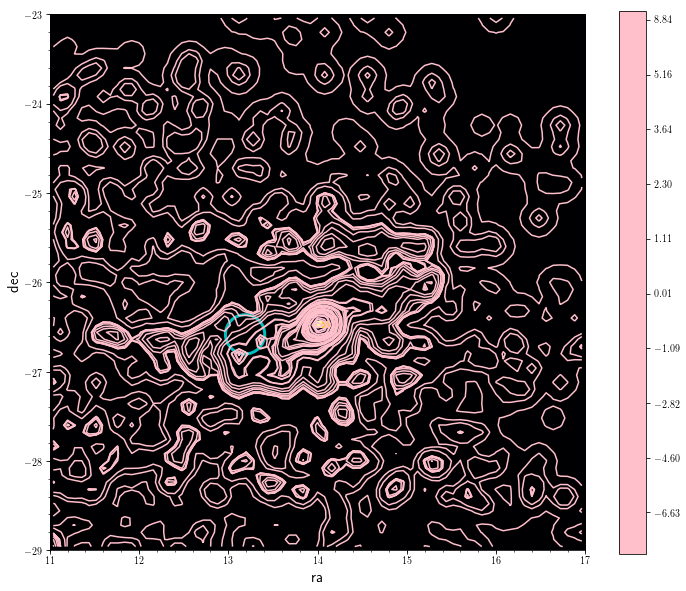

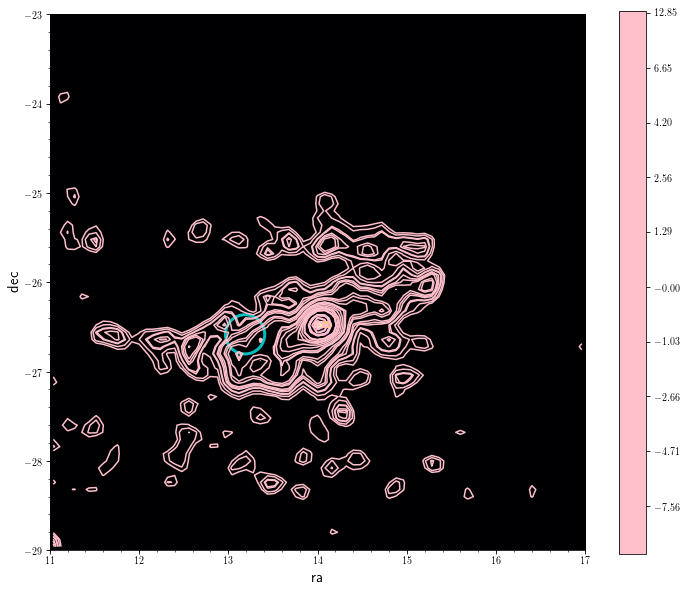

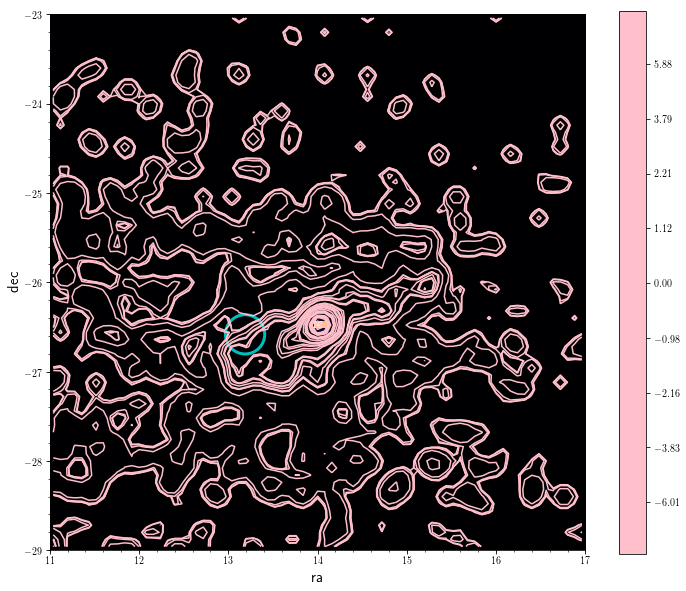

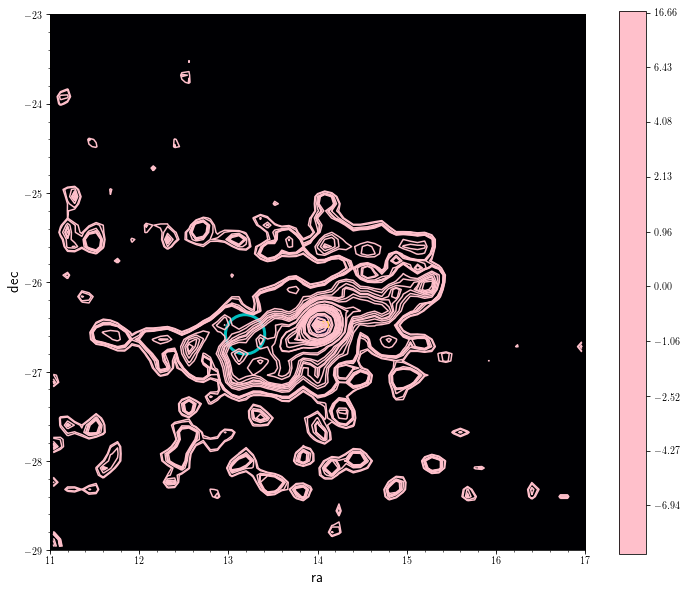

In [111]:
#Position Sapce
GC_radec = pd.DataFrame({'ra': ra_n, 'dec': dec_n})
#GC_radec = GC_radec.as_matrix()

fig=figure()
bovy_plot.bovy_print(fig_width=12, fig_height=10, )
bovy_plot.scatterplot(GC_radec["ra"].dropna().as_matrix(), GC_radec["dec"].dropna().as_matrix(), 'w,',
                      xrange = [11,17], yrange = [-29,-23],
                      cmap='inferno', cntrcolors=['pink'], levels=WT2_aa, bins=75, cntrSmooth=True, gcf=True)
ax = plt.gca()
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=3)
ax.add_artist(circle2)
cb=plt.colorbar()
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)

fig=figure()
bovy_plot.bovy_print(fig_width=12, fig_height=10, )
bovy_plot.scatterplot(GC_radec["ra"].dropna().as_matrix(), GC_radec["dec"].dropna().as_matrix(), 'w,',
                      xrange = [11,17], yrange = [-29,-23],
                      cmap='inferno', cntrcolors=['pink'], levels=WT2_ad, bins=75, cntrSmooth=True, gcf=True)
ax = plt.gca()
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=3)
ax.add_artist(circle2)
cb=plt.colorbar()
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)

fig=figure()
bovy_plot.bovy_print(fig_width=12, fig_height=10, )
bovy_plot.scatterplot(GC_radec["ra"].dropna().as_matrix(), GC_radec["dec"].dropna().as_matrix(), 'w,',
                      xrange = [11,17], yrange = [-29,-23],
                      cmap='inferno', cntrcolors=['pink'], levels=WT2_da, bins=75, cntrSmooth=True, gcf=True)
ax = plt.gca()
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=3)
ax.add_artist(circle2)
cb=plt.colorbar()
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)

fig=figure()
bovy_plot.bovy_print(fig_width=12, fig_height=10, )
bovy_plot.scatterplot(GC_radec["ra"].dropna().as_matrix(), GC_radec["dec"].dropna().as_matrix(), 'w,',
                      xrange = [11,17], yrange = [-29,-23],
                      cmap='inferno', cntrcolors=['pink'], levels=WT2_dd, bins=75, cntrSmooth=True, gcf=True)#, zorder = 0)
ax = plt.gca()
circle2 = plt.Circle((coord_ra_dec.ra.deg, coord_ra_dec.dec.deg), GlobClust_Log_r_t[0]/60, color='c', fill=False, lw=3)#, zorder=2)
ax.add_artist(circle2)

cb=plt.colorbar()
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)

plt.show()

In [2]:
# csv-pd set up for DBSCANN
GlobClust_Log_ra_dec = pd.read_csv('~/GlobClust_ra-dec.csv')
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[0:0,"r_t"]
GlobClust_Log_radec = GlobClust_Log_ra_dec.loc[0:0,"RA":"DEC"]
GlobClust_Log_ID = GlobClust_Log_ra_dec.loc[0:0,"ID"]
GlobClust_Log_r_c = GlobClust_Log_ra_dec.loc[0:0,"r_c"]
GlobClust_Log_r_t = GlobClust_Log_ra_dec.loc[0:0,"r_t"]

coord_ra_dec_deg=[]
coord_ra_dec = SkyCoord(GlobClust_Log_radec.loc[:,"RA"], GlobClust_Log_radec.loc[:,"DEC"], frame='icrs')

GlobClust_Log_dec = coord_ra_dec.dec.deg
GlobClust_Log_ra = coord_ra_dec.ra.deg

In [7]:
#CONE SEARCH
job = Gaia.launch_job_async("SELECT top 1000 gaia.ra, gaia.dec, gaia.l, gaia.b, gaia.pmra, \
gaia.pmdec, gaia.phot_g_mean_mag, gaia.phot_rp_mean_mag, gaia.phot_bp_mean_mag, \
gaia.parallax,gaia.parallax_error,gaia.a_g_val ,panstarrs1.g_mean_psf_mag, \
panstarrs1.g_mean_psf_mag_error,panstarrs1.r_mean_psf_mag,panstarrs1.r_mean_psf_mag_error, \
panstarrs1.i_mean_psf_mag,panstarrs1.i_mean_psf_mag_error FROM gaiadr2.gaia_source \
AS gaia INNER JOIN gaiadr2.panstarrs1_best_neighbour AS panstarrs1_match ON \
panstarrs1_match.source_id = gaia.source_id INNER JOIN gaiadr2.panstarrs1_original_valid \
AS panstarrs1 ON panstarrs1.obj_id = panstarrs1_match.original_ext_source_id \
WHERE 1=CONTAINS(POINT('ICRS',gaia.ra,gaia.dec),CIRCLE('ICRS',%f,%f,%f))" % \
(GlobClust_Log_ra,GlobClust_Log_dec,GlobClust_Log_r_t/60*15),dump_to_file=False)
data = job.get_results()

/usr/local/lib/python3.6/site-packages/astropy/io/votable/tree.py:1652: W27: None:3:0: W27: COOSYS deprecated in VOTable 1.2
  warn_or_raise(W27, W27, (), config, pos)

/usr/local/lib/python3.6/site-packages/astropy/io/votable/tree.py:722: W35: None:5:0: W35: 'value' attribute required for INFO elements
  warn_or_raise(W35, W35, ('value'), self._config, self._pos)

/usr/local/lib/python3.6/site-packages/astropy/io/votable/tree.py:722: W35: None:6:0: W35: 'value' attribute required for INFO elements
  warn_or_raise(W35, W35, ('value'), self._config, self._pos)

/usr/local/lib/python3.6/site-packages/astropy/io/votable/tree.py:722: W35: None:7:0: W35: 'value' attribute required for INFO elements
  warn_or_raise(W35, W35, ('value'), self._config, self._pos)

/usr/local/lib/python3.6/site-packages/astropy/io/votable/tree.py:722: W35: None:8:0: W35: 'value' attribute required for INFO elements
  warn_or_raise(W35, W35, ('value'), self._config, self._pos)

/usr/local/lib/python3.6/site-packa

In [20]:
#data
PANSTARRS_Log = pd.read_csv('~/PANSTARRS_NGC288_boxquery_4deg.csv')
#PANSTARRS_Log.reindex()

In [8]:
data

ra,dec,l,b,pmra,pmdec,phot_g_mean_mag,phot_rp_mean_mag,phot_bp_mean_mag,parallax,parallax_error,a_g_val,g_mean_psf_mag,g_mean_psf_mag_error,r_mean_psf_mag,r_mean_psf_mag_error,i_mean_psf_mag,i_mean_psf_mag_error
deg,deg,deg,deg,mas.yr**-1,mas.yr**-1,mag,mag,mag,mas,mas,mag,,mag,mag,mag,mag,mag
float64,float64,float64,float64,float64,float64,float32,float32,float32,float64,float64,float32,float64,float64,float64,float64,float64,float64
16.207946523380006,-26.571437159047459,203.13348173294767,-86.961179496086714,6.0170330875464941,-1.2360519010698638,20.976778,20.059278,21.627687,-1.8539003621910868,2.2262415395833539,--,21.607599258422901,0.16369199752807601,20.928400039672901,0.033234000205993701,20.277999877929702,0.0151770003139973
15.541818180600048,-27.209738769842009,215.49979702367892,-87.612276219973168,-0.12223048704591821,-7.2629510614301758,16.565453,16.075706,16.89724,0.42367322530344548,0.067131095243632616,0.0515,16.903499603271499,0.0043429997749626602,16.565200805664102,0.0096380002796649898,16.4214992523193,0.0034560000058263501
14.908625539012853,-26.567933573714427,196.35747718843467,-88.087834463831229,34.589881131901201,-14.711322473333759,20.92691,19.570204,22.298895,0.30636126035119204,2.2749423349336895,--,21.9368991851807,0.217402994632721,21.707899093627901,0.069191999733448001,20.0496006011963,0.017742000520229301
15.886725300594064,-26.521137723081193,200.95220732968531,-87.231217833045321,-5.3795591098459559,0.82249661096194238,19.577713,18.618767,20.528069,0.60539183966404475,0.51108020730632586,--,20.900999069213899,0.018480999395251298,19.628099441528299,0.0149670001119375,18.957799911498999,0.0106220003217459
15.483308409905492,-26.71113128519012,203.41851787051974,-87.623640971801592,--,--,21.064175,--,--,--,--,--,--,--,21.5140991210938,0.082748003304004697,20.168699264526399,0.033144999295473099
15.540002022392924,-27.122501216339604,213.4050461030703,-87.614344327454162,--,--,19.882713,--,--,--,--,--,19.260799407958999,0.045905999839305899,18.5223999023438,0.050634000450372703,18.143800735473601,0.037973999977111803
15.521559854801467,-26.103049859317018,190.22795702096724,-87.408689302872872,--,--,20.186985,18.020506,19.635609,--,--,--,19.9815998077393,0.054567001760005999,19.148799896240199,0.050535000860691098,18.657600402831999,0.0143870003521442
15.537905223148501,-27.181735080778036,214.82863906281545,-87.616249018799905,-0.20860689705509311,-2.005678931695027,19.50758,17.943235,18.899899,-0.74497946455006192,1.2708331664361077,--,19.1574001312256,0.0271029993891716,19.0217990875244,0.029312999919056899,18.5158996582031,0.030633000656962402


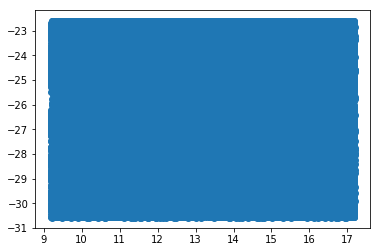

In [21]:
plt.scatter(PANSTARRS_Log['ra'], PANSTARRS_Log['dec'])
plt.show()

In [22]:
shape(PANSTARRS_Log)

(118965, 19)

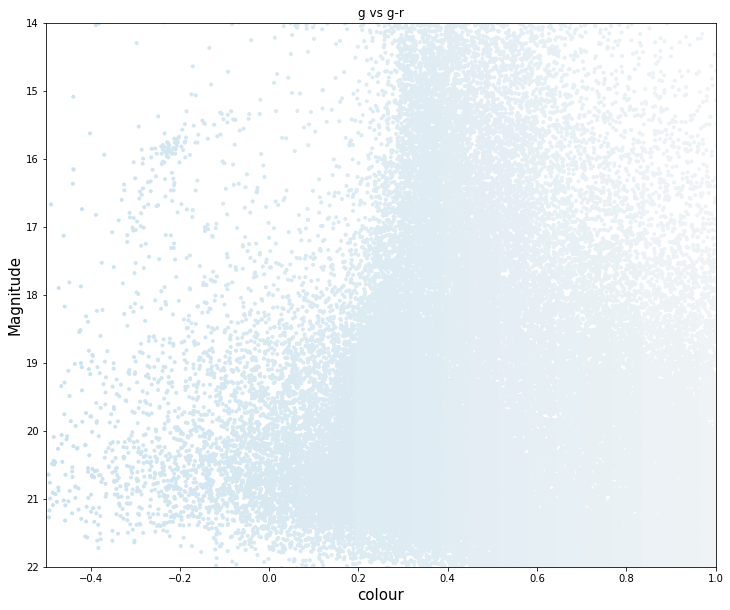

In [31]:
PS_colour = PANSTARRS_Log['g_mean_psf_mag']-PANSTARRS_Log['r_mean_psf_mag']
PS_Mag = PANSTARRS_Log['g_mean_psf_mag']-5*((np.log10(8900)) - 1)

fig=plt.figure(figsize=(12,10))
plt.scatter(PS_colour, PANSTARRS_Log['g_mean_psf_mag'], marker='.', c=PS_colour, cmap='RdBu_r')
plt.gca().invert_yaxis()
plt.title('g vs g-r')
plt.xlabel('colour', fontsize=15)
plt.ylabel('Magnitude', fontsize=15)
#plt.legend()
#plt.gca().set_ylim([20.7, 18.7])
#plt.gca().set_xlim([0.15,0.52])
plt.gca().set_ylim([22, 14])
plt.gca().set_xlim([-0.5,1])
plt.show()

#M_uplim=20.7-5*((log10(d_pc[5])) - 1)
#M_dlim=18.7-5*((log10(d_pc[5])) - 1)


In [24]:
#GlobClust_Log_2 = pd.read_csv('~/out_NGC 288_full_12-rt_ra_dec.csv')
GlobClust_Log_2 = pd.read_csv('~/PANSTARRS_NGC288_boxquery_4deg.csv')
GlobClust_Log_pmra = GlobClust_Log_2.loc[:,"pmra"]
GlobClust_Log_pmdec = GlobClust_Log_2.loc[:,"pmdec"]
GlobClust_Log_ra = GlobClust_Log_2.loc[:,"ra"]
GlobClust_Log_dec = GlobClust_Log_2.loc[:,"dec"]

GlobClust_Log_g = GlobClust_Log_2.loc[:,"phot_g_mean_mag"]
GlobClust_Log_rp = GlobClust_Log_2.loc[:,"phot_rp_mean_mag"]
GlobClust_Log_bp = GlobClust_Log_2.loc[:,"phot_bp_mean_mag"]
GlobClust_Log_rpbp = GlobClust_Log_bp - GlobClust_Log_rp
GlobClust_Log_ra_out = GlobClust_Log_2.loc[:,"ra"]
GlobClust_Log_dec_out = GlobClust_Log_2.loc[:,"dec"]
GlobClust_Log_pmdec_out = GlobClust_Log_2.loc[:,"pmdec"]
GlobClust_Log_pmra_out = GlobClust_Log_2.loc[:,"pmra"]

#GlobClust_Log_pmra = GlobClust_Log_pmra.as_matrix()
#GlobClust_Log_pmdec = GlobClust_Log_pmdec.as_matrix()
#GlobClust_Log_ra = GlobClust_Log_ra.as_matrix()
#GlobClust_Log_dec = GlobClust_Log_dec.as_matrix()

GlobClust_Log_parallax_out = GlobClust_Log_2.loc[:,"parallax"]
GlobClust_Log_parallaxerror_out = GlobClust_Log_2.loc[:,"parallax_error"]
GlobClust_Log_parallaxe_out = GlobClust_Log_2.loc[:,"parallax":"parallax_error"]

# DBSCANN - parallax before scan
GlobClust_Log_parallaxover_out = GlobClust_Log_parallaxerror_out/GlobClust_Log_parallax_out

#parallax_indx = (GC_parallaxover>0.20) | ((1/GC_parallax>5.)*(GC_parallaxover<0.20))
parallax_indx=((1/GlobClust_Log_parallax_out<5.)*(GlobClust_Log_parallaxover_out<0.10))
parallax_indx=[not i for i in parallax_indx]

Clust_Edge = GlobClust_Log_r_c[0]
print(Clust_Edge)
d_pc=8900

#M=m-5(log(d)-1)
GlobClust_Log_M = GlobClust_Log_g-5*((np.log10(d_pc)) - 1)

indx = (np.sqrt((np.fabs(GlobClust_Log_ra_out-coord_ra_dec.ra.deg)**2+np.fabs(GlobClust_Log_dec_out-coord_ra_dec.de\
c.deg)**2))<Clust_Edge/60)

/home/kaderali/.local/lib/python3.6/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  unsupported[op_str]))

1.35


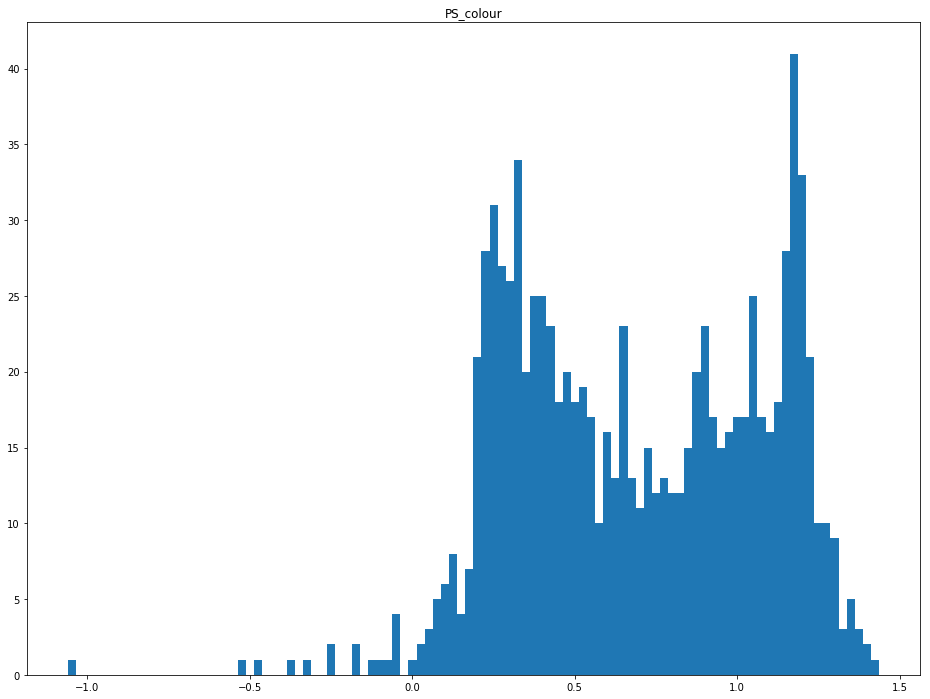

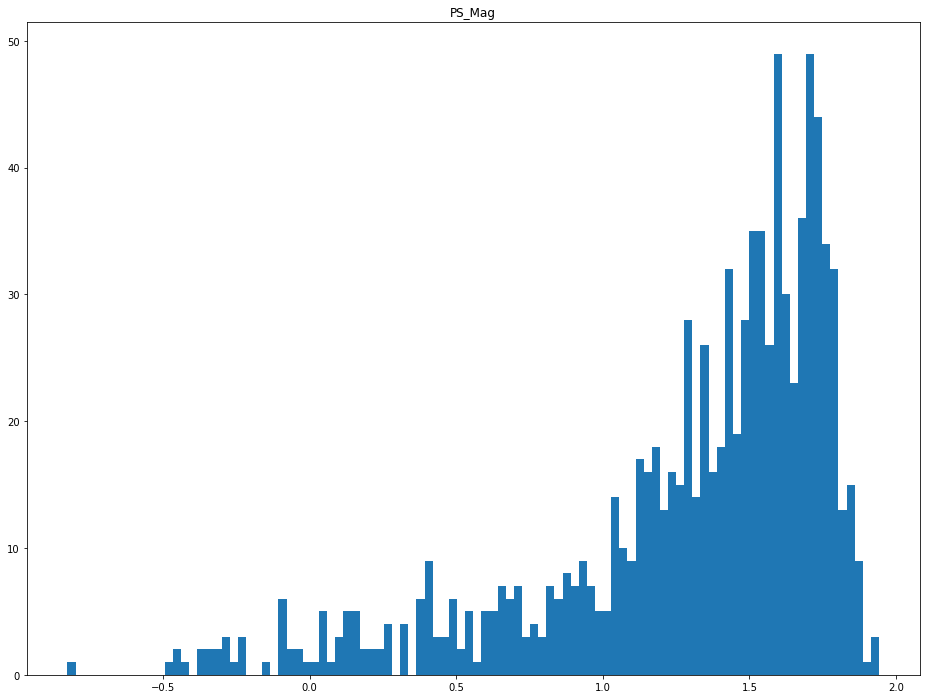

In [51]:
data_pd=data.to_pandas()

PS_colour_pd = data_pd.loc[:,"g_mean_psf_mag"] -  data_pd.loc[:,"r_mean_psf_mag"]
PS_Mag_pd = data_pd.loc[:,"g_mean_psf_mag"] -5*((np.log10(d_pc)) - 1)

fig=plt.figure(figsize=(16,12))
plt.hist(PS_colour_pd.dropna(), bins=100)#, range=[-1.5,4.5])
plt.title('PS_colour')

fig=plt.figure(figsize=(16,12))
plt.hist(PS_Mag_pd.dropna()/4, bins=100)#, range=[-1.5,4.5])
plt.title('PS_Mag')

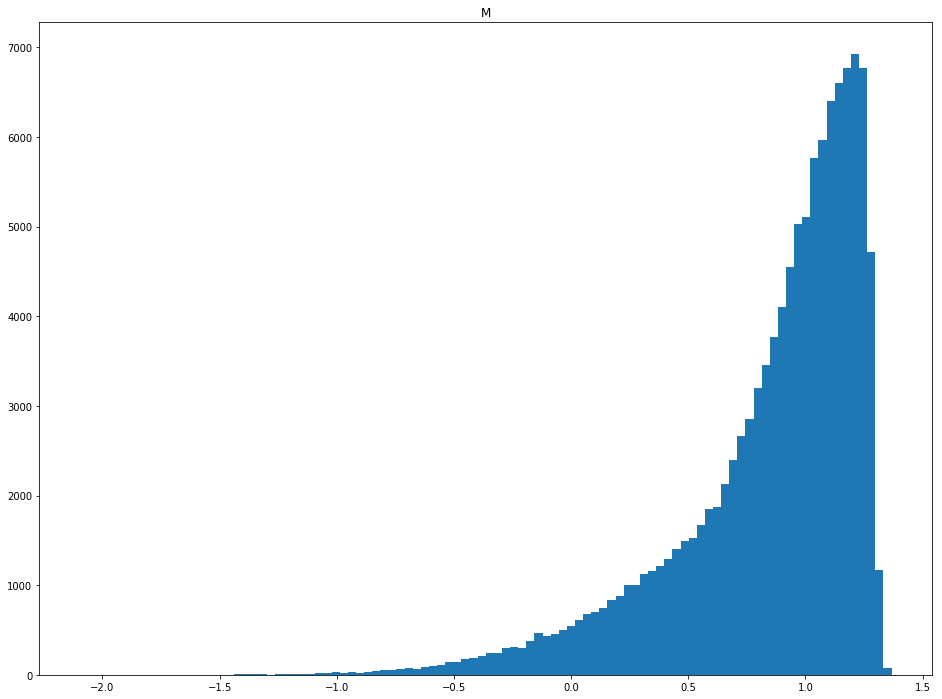

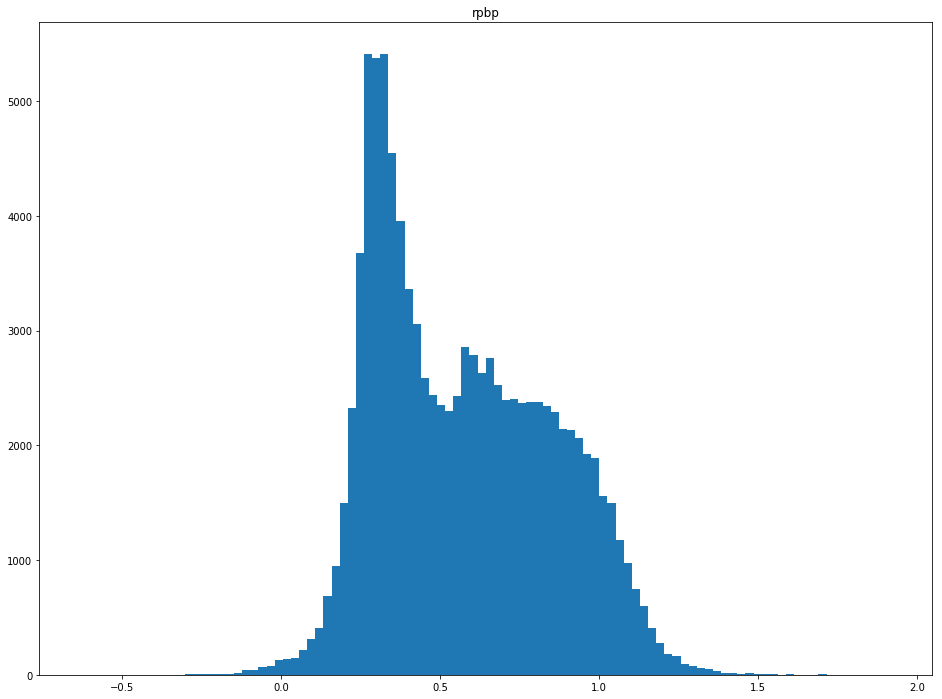

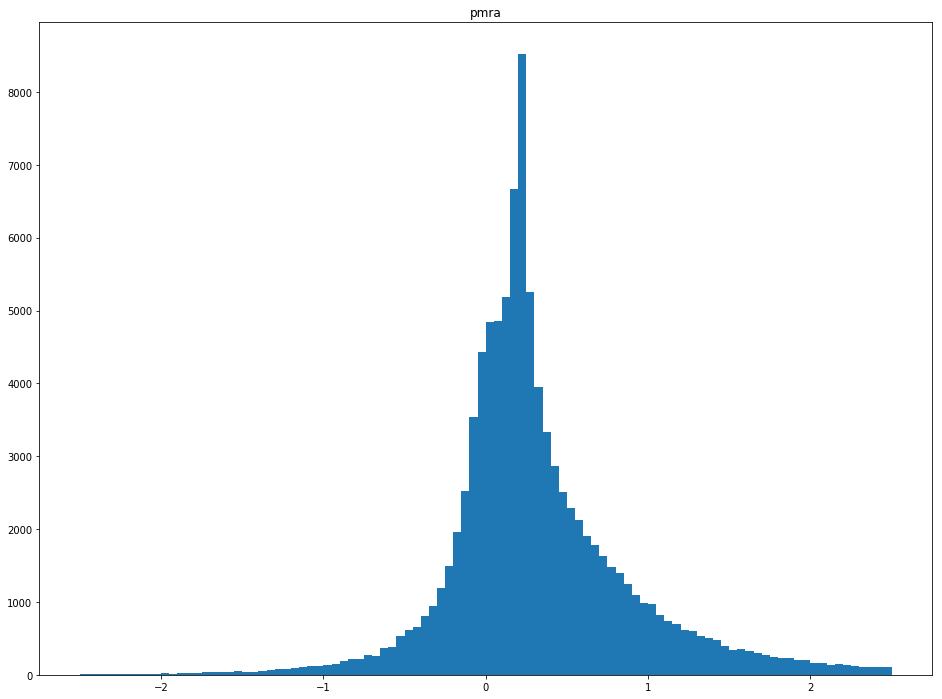

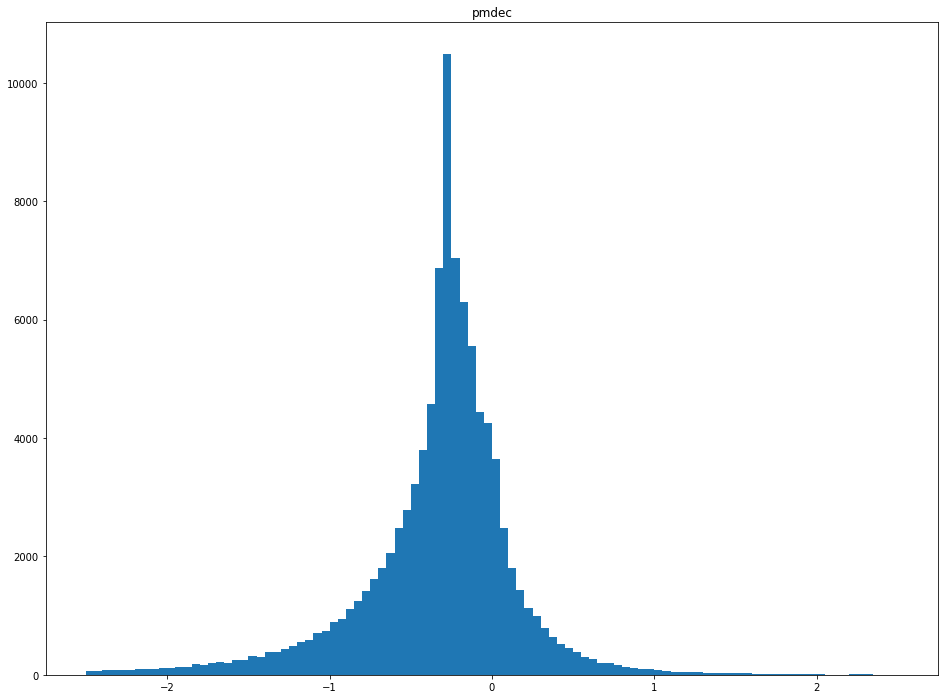

In [19]:
fig=plt.figure(figsize=(16,12))
plt.hist(GlobClust_Log_M/5, bins=100)#, range=[-1.5,4.5])
plt.title('M')

fig=plt.figure(figsize=(16,12))
plt.hist(GlobClust_Log_rpbp.dropna()/2.5, bins=100)#, range=[0.1,1.3])
plt.title('rpbp')

fig=plt.figure(figsize=(16,12))
plt.hist(GlobClust_Log_pmra.dropna()/20, bins=100, range=[-2.5,2.5])
plt.title('pmra')

fig=plt.figure(figsize=(16,12))
plt.hist(GlobClust_Log_pmdec.dropna()/20, bins=100, range=[-2.5,2.5])
plt.title('pmdec')

plt.show()

In [17]:
print(shape(GlobClust_Log_pmra[parallax_indx]), shape(PS_colour[PS_CMD_indx]))

(85994,) (73472,)


/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """

/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in less
  """

(36245, 4)
[-1 -1 -1 ... -1 -1 -1]
(36245,)
Estimated number of Subgroups: 4


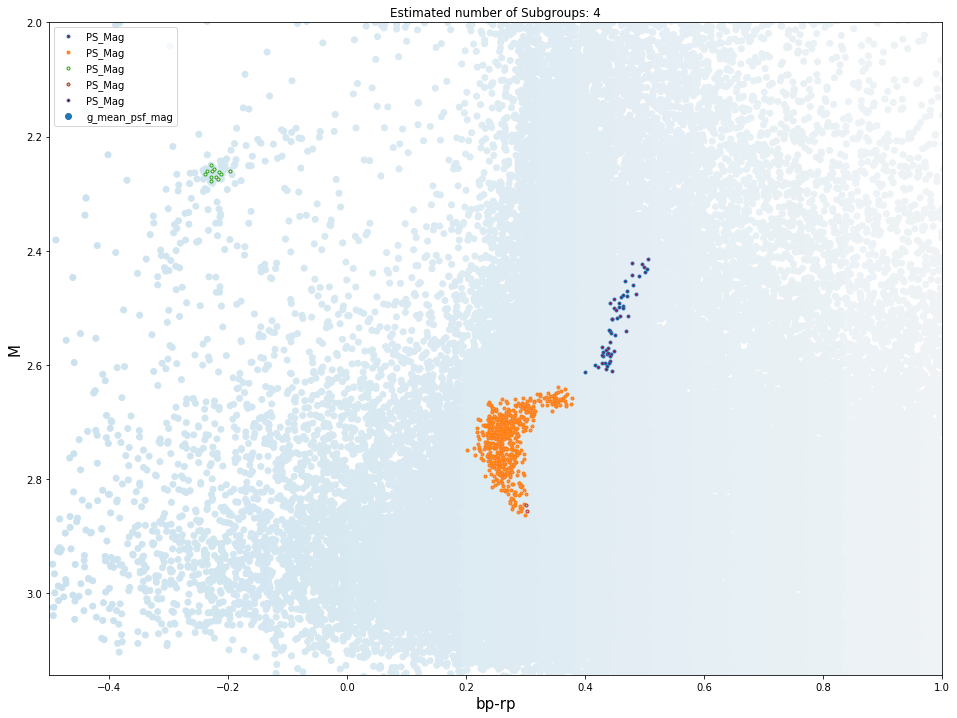

In [25]:
# DBSCAN - with parallax criteria
DB_Params =[]
DB_Params=np.transpose(DB_Params)

PS_CMD_indx = (14 < PANSTARRS_Log['g_mean_psf_mag'].as_matrix()) & (PANSTARRS_Log['g_mean_psf_mag'].as_matrix() < 22) & \
                (-0.5 < PS_colour.as_matrix()) & (PS_colour.as_matrix() < 1)

DF={#'M': GlobClust_Log_M[parallax_indx]/5, 'rpbp': GlobClust_Log_rpbp[parallax_indx]/2.5, 
    'pmra': GlobClust_Log_pmra[parallax_indx]/10, 'pmdec': GlobClust_Log_pmdec[parallax_indx]/10,
   'PS_colour': PS_colour[PS_CMD_indx], 'PS_Mag': PANSTARRS_Log['g_mean_psf_mag'][PS_CMD_indx]/7}

DB_Params = pd.DataFrame(data=DF)
DB_Params=DB_Params.dropna()

print(shape(DB_Params))

db=sklearn.cluster.DBSCAN(eps=0.030, min_samples=15, metric='euclidean', metric_params=None, algorithm='auto', 
                      leaf_size=30, p=None, n_jobs=1).fit(DB_Params) #original eps=0.1625

print(db.labels_)
print(shape(db.labels_))

fig=plt.figure(figsize=(16,12))
#plt.scatter(GlobClust_Log_rpbp/2.5, GlobClust_Log_M/5, c=GlobClust_Log_rpbp/2.5, cmap='RdBu_r')
plt.scatter(PS_colour, PANSTARRS_Log['g_mean_psf_mag']/7, c=PS_colour, cmap='RdBu_r')
#plt.scatter(db,DB_Params)
#plt.show()

core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

print('Estimated number of Subgroups: %d' % n_clusters_)

x_param3=[]
y_param3=[]

x_param4=[]
y_param4=[]

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    
    #NOISE
    #xy = DB_Params[class_member_mask & ~core_samples_mask]
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=6)
    
    #CLEANED DATA
    xy = DB_Params[class_member_mask & core_samples_mask]
    
    #plt.plot(xy.loc[:, "rpbp"], xy.loc[:, "M"], 'o', markerfacecolor=tuple(col),
    #         markeredgecolor='k', markersize=14)
    
    #x_param3.append(xy.loc[:, "rpbp"]*2.5)
    #y_param3.append(xy.loc[:, "M"]*5)
    
    plt.plot(xy.loc[:, "PS_colour"], xy.loc[:, "PS_Mag"], '.', markerfacecolor=tuple(col),)
#             markeredgecolor='k', markersize=14)
    
    x_param3.append(xy.loc[:, "PS_colour"])
    y_param3.append(xy.loc[:, "PS_Mag"]*7)

    #x_param4.append(xy.loc[:, "pmra"]*0.35)
    #y_param4.append(xy.loc[:, "pmdec"]*0.3)
    
    #x_param5.append(xy.loc[:, "ra"]*0.35)
    #y_param5.append(xy.loc[:, "dec"]*0.3)

plt.gca().invert_yaxis()
plt.title('Estimated number of Subgroups: %d' % n_clusters_)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
plt.gca().set_ylim([22/7, 14/7])
plt.gca().set_xlim([-0.5,1])
plt.legend()
plt.show()
#fig.savefig('GC_DBSCAN'+ GlobClust_Log_ID[0] +'eps0p165-mins10_coreCMD-fullsetiponfullcmd.png')

(593, 1)


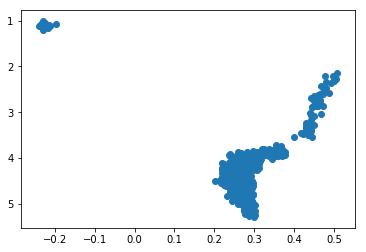

In [26]:
x_out3 = pd.DataFrame(x_param3)#, index=None)#, mangle_dupe_cols=True)
#x_out3.reset_index()
x_out3 = x_out3.transpose() 
x_out3 = x_out3.loc[:,~x_out3.columns.duplicated()]
#x_out3 = x_out3["rpbp"].as_matrix()
x_out3

y_out3 = pd.DataFrame(y_param3)#, index=None)#, mangle_dupe_cols=True)
#y_out3.reset_index()
y_out3 = y_out3.transpose() 
y_out3 = y_out3.loc[:,~y_out3.columns.duplicated()]
#y_out3 = y_out3["M"].as_matrix()
print(shape(y_out3))

GC_ra = pd.DataFrame({'ra':GlobClust_Log_ra})
GC_dec = pd.DataFrame({'dec':GlobClust_Log_dec})
GC_pmra = pd.DataFrame({'pmra':GlobClust_Log_pmra})
GC_pmdec = pd.DataFrame({'pmdec':GlobClust_Log_pmdec})

ra_DB = GC_ra.reindex(x_out3.index)
dec_DB = GC_dec.reindex(y_out3.index)
pmra_DB = GC_pmra.reindex(x_out3.index)
pmdec_DB = GC_pmdec.reindex(y_out3.index)
M_DB = GlobClust_Log_M.reindex(y_out3.index)
rpbp_DB = GlobClust_Log_rpbp.reindex(y_out3.index)

PS_g_DB = PS_Mag.reindex(y_out3.index)
PS_M_DB = PANSTARRS_Log['g_mean_psf_mag'].reindex(y_out3.index)-5*((np.log10(d_pc)) - 1)
PS_colour_DB = PS_colour.reindex(x_out3.index)

pmra_DB_norm = (pmra_DB-pmra_DB.mean())#/(pmra_DB.mean())
pmdec_DB_norm = (pmdec_DB-pmdec_DB.mean())#/(pmdec_DB.mean())

PS_colour_DB = PS_colour.reindex(y_out3.index)
PS_Mag_DB = PS_Mag.reindex(x_out3.index)

plt.scatter(PS_colour_DB, PS_Mag_DB)
plt.gca().invert_yaxis()
plt.show()

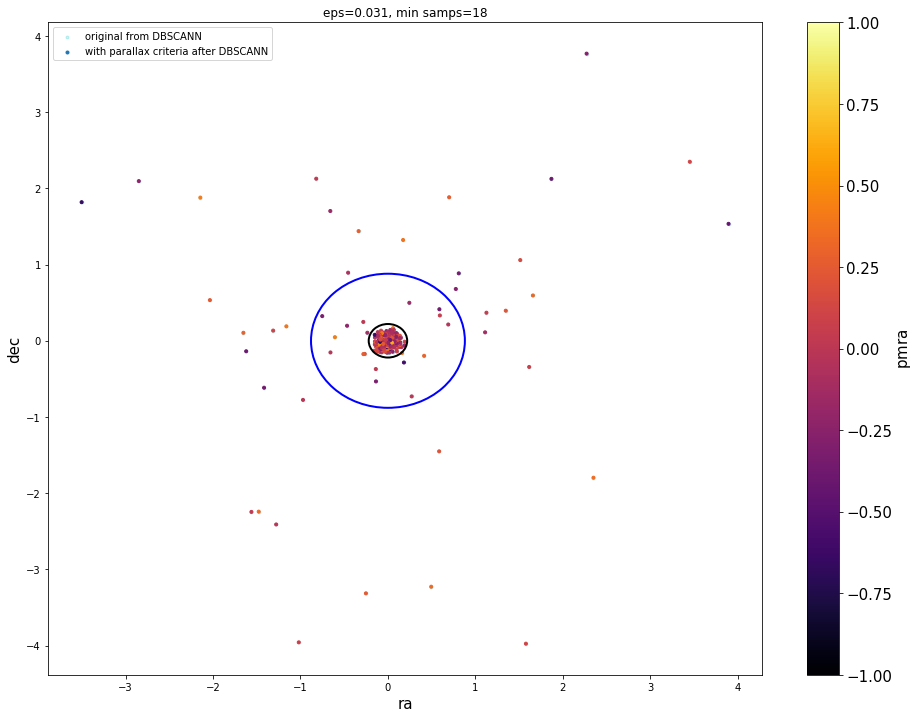

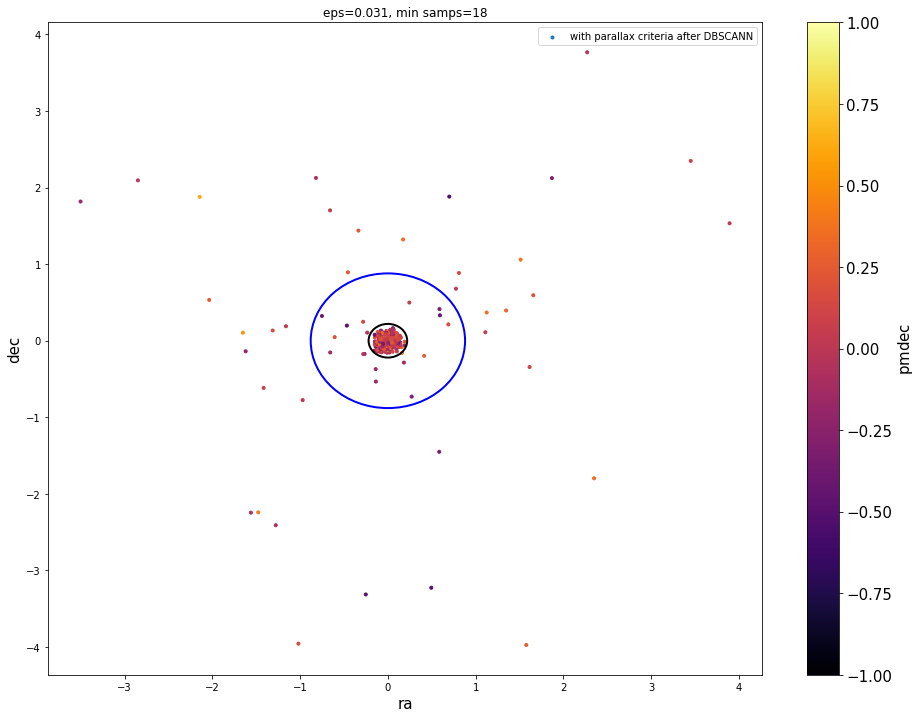

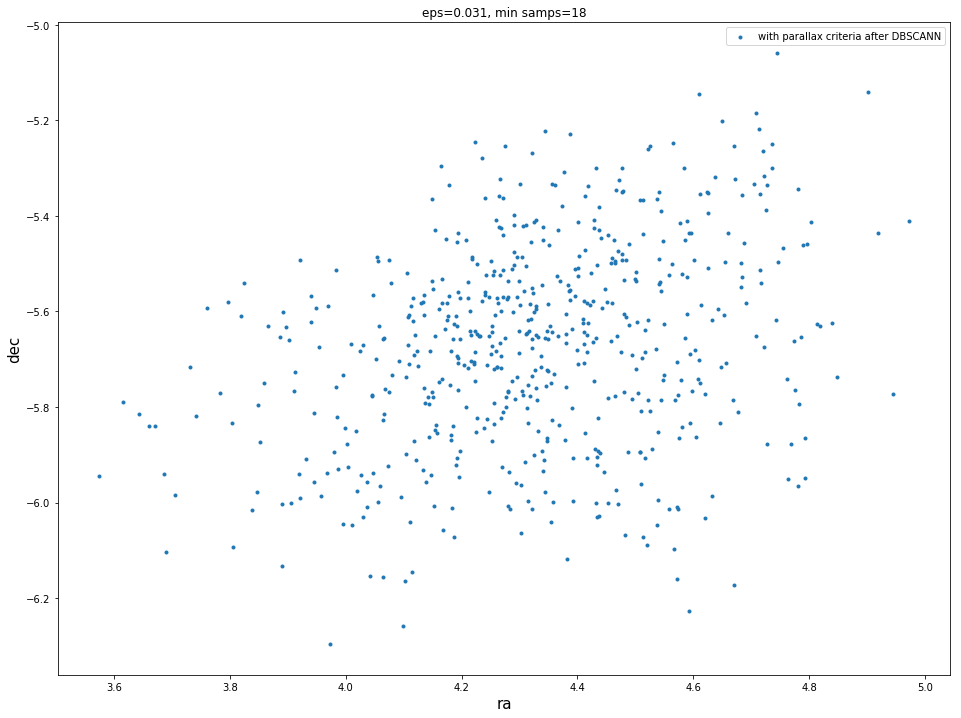

In [27]:
fig = plt.figure(figsize=(16,12))
ax = plt.gca()
plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2,marker ='.',label='original from DBSCANN' )
plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c=pmra_DB_norm, cmap='inferno',marker ='.',
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=2)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmra}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c=pmdec_DB_norm, cmap='inferno',marker ='.',
            vmin=-1, vmax=1, label='with parallax criteria after DBSCANN')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=2)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
ax.add_artist(circle)
ax.add_artist(circle2)
plt.title('eps=0.031, min samps=18')
cb=plt.colorbar()
cb.ax.tick_params(labelsize=15)
cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

fig = plt.figure(figsize=(16,12))
ax = plt.gca()
#plt.scatter(ra_DB-coord_ra_dec.ra.deg, dec_DB-coord_ra_dec.dec.deg, c='c', alpha=0.2, label='original from DBSCANN' )
plt.scatter(pmra_DB, pmdec_DB,marker ='.',label='with parallax criteria after DBSCANN')
circle = plt.Circle((0, 0), GlobClust_Log_r_t[0]/60, color='k', fill=False, lw=2)
circle2 = plt.Circle((0, 0), 4*GlobClust_Log_r_t[0]/60, color='b', fill=False, lw=2)
#ax.add_artist(circle)
#ax.add_artist(circle2)
plt.title('eps=0.031, min samps=18')
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().set_ylim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_xlim([4*GlobClust_Log_r_t.as_matrix()/60, -4*GlobClust_Log_r_t.as_matrix()/60])
#plt.gca().set_ylim([2,-2])
#plt.gca().set_xlim([-2, 2])
plt.legend()
plt.show()

In [53]:
print(shape(PS_colour_DB), shape(PS_M_DB))
print(shape(GlobClust_Log_M), shape(M_DB), shape(y_out3))
M_DB

(2026,) (2026,)
(118965,) (2026,) (2026, 1)


1334      5.193310
1693      4.061857
2126      2.922081
2267      5.114636
2963      3.349901
3254      4.749535
5462      4.214579
5827      5.400084
6238      4.114176
6689      4.935326
7244      4.589930
7416      4.083267
7531      3.033884
7832      5.049679
8044      3.365627
9054      4.768885
9520      5.166992
9638      4.729143
9665      5.594286
11145     5.551859
11583     4.472822
12651     3.524008
12771     4.233856
12772     5.399128
12792     5.335350
12873     3.657578
12918     5.559822
12921     3.918915
12973     3.982350
12994     5.255097
            ...   
95296     4.388216
96235     4.667135
97237     4.312559
97459     5.566044
97551     4.810207
97771     4.207993
97878     5.372997
99695     5.765669
99732     3.940073
99772     4.614166
99988     4.617003
101278    4.279814
101296    5.106924
103067    5.088310
103457    4.884974
105087    5.620501
105156    4.876400
105516    4.342291
106488    4.762554
107925    5.109232
108280    5.111572
111528    5.

In [28]:
import time

t0 = time.time()

M_f = []
colour_f = []

M_i = GlobClust_Log_M.as_matrix()
M_k = PS_M_DB.as_matrix()
rpbp_i = GlobClust_Log_rpbp.as_matrix()
colour_k = PS_colour_DB.as_matrix()

Cluster = np.zeros(len(M_k), dtype='bool')

for i in range(1, len(M_i)):
    for k in range(0, len(M_k)):
        if M_k[k] == M_i[i] and colour_k[k] == rpbp_i[i]:
            M_f.append(M_k[k])
            colour_f.append(colour_k[k])
            Cluster[i]=True
            break
            
t1 = time.time()
total = t1-t0
print(total)
print(shape(M_f))
#print(Cluster)
print(np.shape(Cluster))
print(np.sum(Cluster))


21.387616634368896
(0,)
(593,)
0


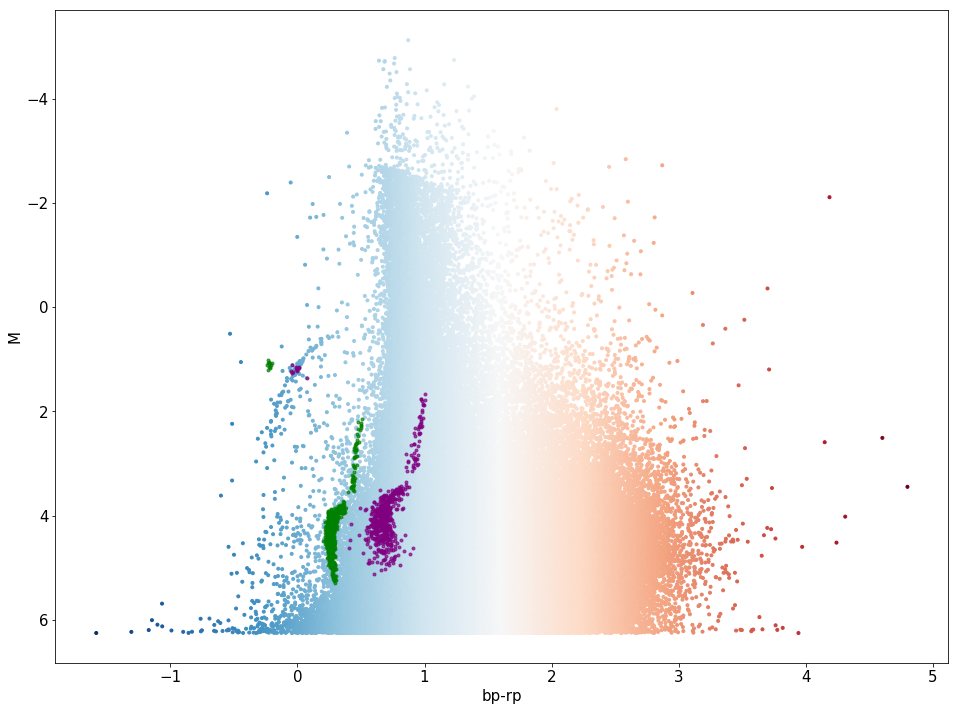

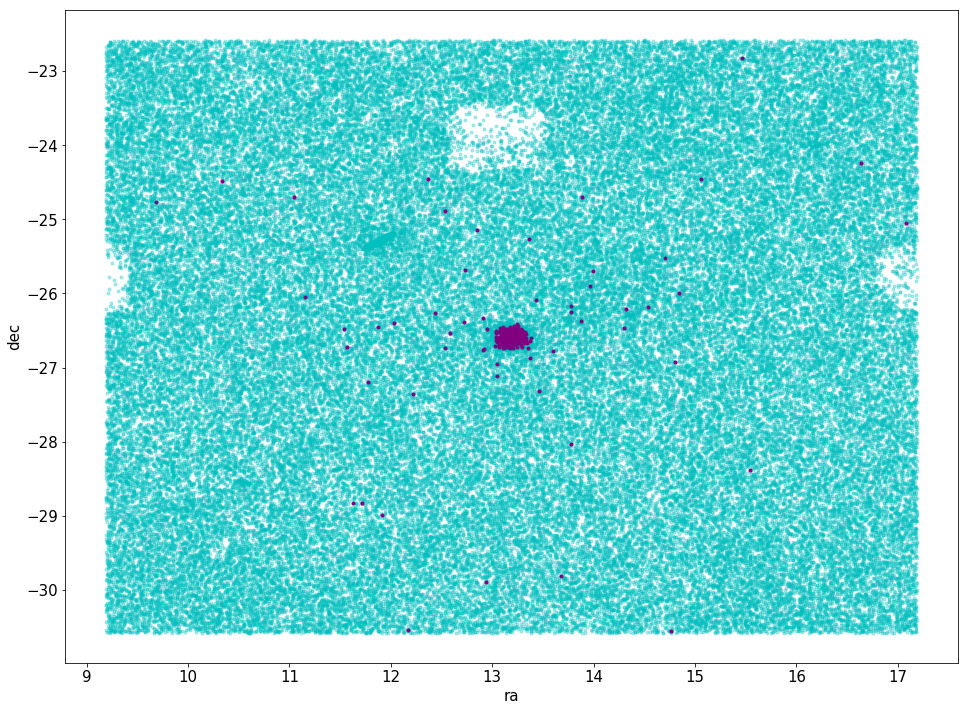

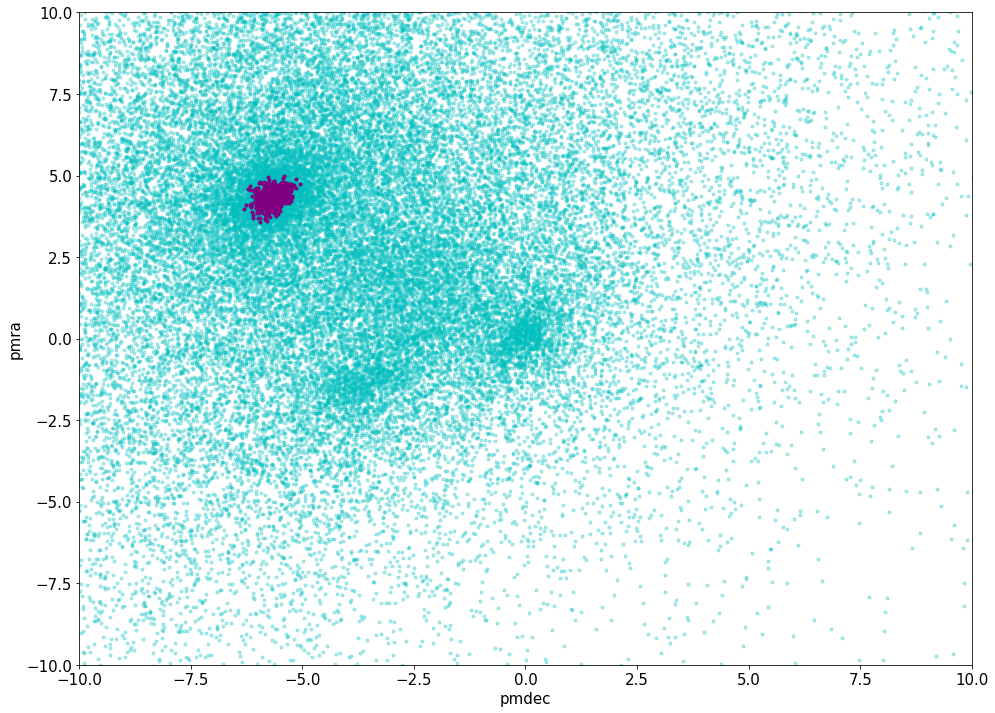

In [33]:
fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r', marker='.')
plt.scatter(x=rpbp_DB, y=M_DB, c='purple', alpha=0.7, marker='.')
plt.scatter(x=PS_colour_DB, y=PS_M_DB, c='g', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().invert_yaxis()
plt.show()

fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_ra_out, y=GlobClust_Log_dec_out, c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_DB, y=dec_DB, c='purple', marker='.')#, alpha=0.2)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.show()

fig=plt.figure(figsize=(16,12))
#plt.hexbin(GlobClust_Log_pmdec_out, GlobClust_Log_pmra_out, extent=[-10,10, -10,10], bins='log',gridsize=200)
plt.scatter(x=GlobClust_Log_pmdec_out[parallax_indx], y=GlobClust_Log_pmra_out[parallax_indx], c='c', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=pmdec_DB, y=pmra_DB, c='purple', marker='.')#, alpha=0.2)
plt.ylabel('pmra', fontsize=15)
plt.xlabel('pmdec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().set_ylim([-10,10])
plt.gca().set_xlim([-10,10])
#plt.gca().set_ylim([3.5,4.6])
#plt.gca().set_xlim([-7.5,-3.5])
plt.show()

In [45]:
type(ra_DB)

#rpbp_DB[indx2]
#M_DB[indx2]
np.sum(indx2)
indx2

array([[False],
       [False],
       [False],
       ...,
       [False],
       [False],
       [False]])

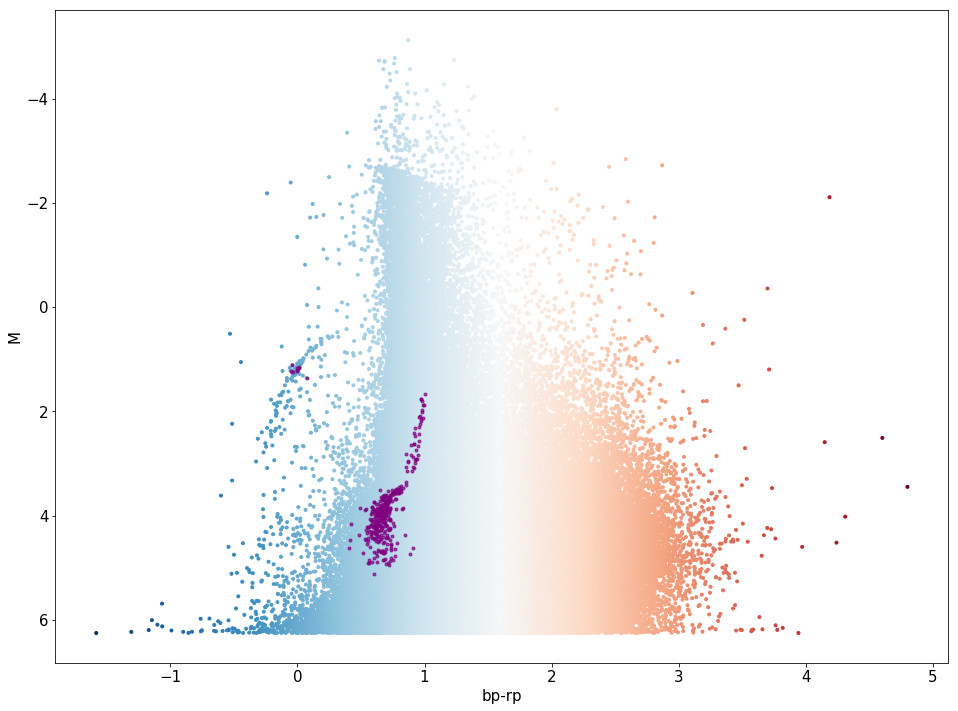

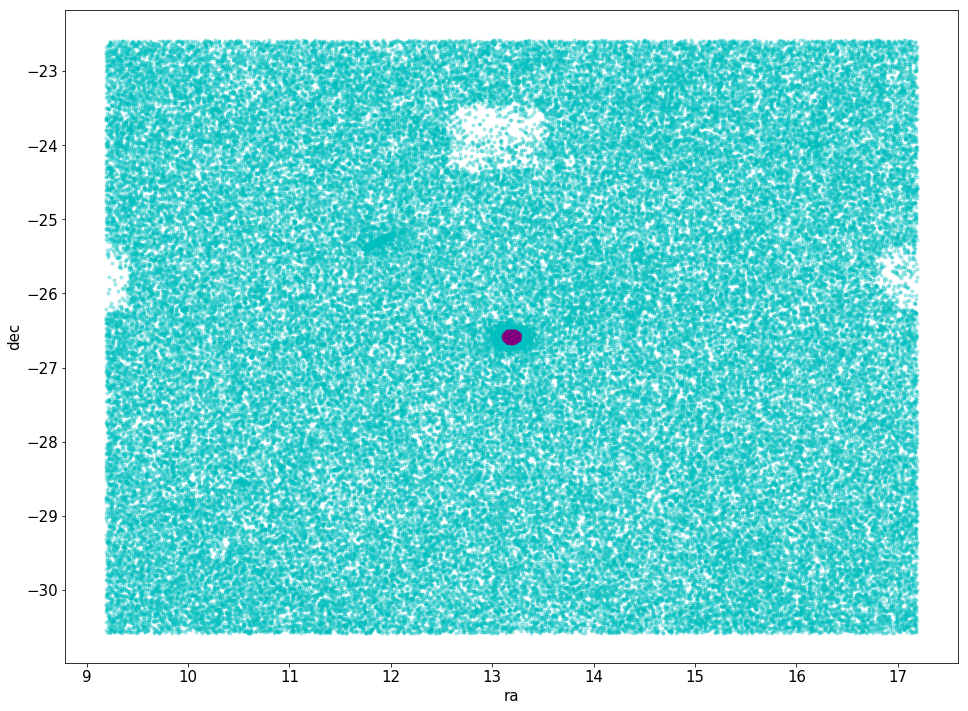

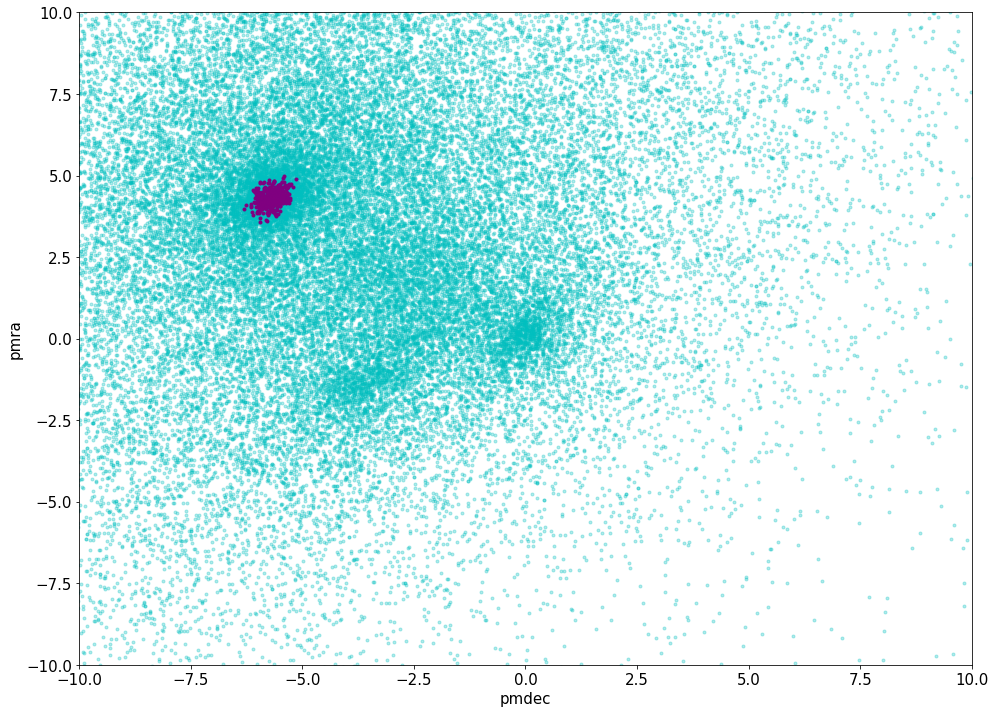

In [25]:
indx2 = (np.sqrt((np.fabs(GlobClust_Log_ra.as_matrix()-coord_ra_dec.ra.deg)**2+\
                  np.fabs(GlobClust_Log_dec.as_matrix()-coord_ra_dec.dec.deg)**2))<5/60)

GC_ra2 = GlobClust_Log_ra[indx2]
GC_dec2 = GlobClust_Log_dec[indx2]
ra_DB2 = GC_ra2.reindex(x_out3.index)
dec_DB2 = GC_dec2.reindex(y_out3.index)

GC_rpbp2 = GlobClust_Log_rpbp[indx2]
GC_M2 = GlobClust_Log_M[indx2]
rpbp_DB2 = GC_rpbp2.reindex(x_out3.index)
M_DB2 = GC_M2.reindex(y_out3.index)

GC_pmra2 = GlobClust_Log_pmra[indx2]
GC_pmdec2 = GlobClust_Log_pmdec[indx2]
pmra_DB2 = GC_pmra2.reindex(x_out3.index)
pmdec_DB2 = GC_pmdec2.reindex(y_out3.index)

#rpbp_DB_pd = rpbp_DB[indx2]
#M_DB_pd = M_DB[indx2]
#ra_DB_pd = ra_DB[indx2]
#dec_DB_pd = dec_DB[indx2]
#pmra_DB_pd = pmra_DB[indx2]
#pmdec_DB_pd = pmdec_DB[indx2]

fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_rpbp, y=GlobClust_Log_M, c=GlobClust_Log_rpbp, cmap='RdBu_r', marker='.')
#plt.scatter(x=GlobClust_Log_rpbp[indx2], y=GlobClust_Log_M[indx2], c='purple', marker='.')
plt.scatter(x=rpbp_DB2, y=M_DB2, c='purple', alpha=0.7, marker='.')
#plt.scatter(x=rpbp_ic, y=M_ic, c='g', alpha=0.2, marker='.')
plt.xlabel('bp-rp', fontsize=15)
plt.ylabel('M', fontsize=15)
plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.show()

fig=plt.figure(figsize=(16,12))
plt.scatter(x=GlobClust_Log_ra_out, y=GlobClust_Log_dec_out, c='c', alpha=0.3, marker='.')
#plt.scatter(x=GlobClust_Log_ra_out[indx2], y=GlobClust_Log_dec_out[indx2], c='purple', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=ra_DB2, y=dec_DB2, c='purple', marker='.')#, alpha=0.2)
plt.xlabel('ra', fontsize=15)
plt.ylabel('dec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.show()

fig=plt.figure(figsize=(16,12))
#plt.hexbin(GlobClust_Log_pmdec_out, GlobClust_Log_pmra_out, extent=[-10,10, -10,10], bins='log',gridsize=200)
plt.scatter(x=GlobClust_Log_pmdec_out[parallax_indx], y=GlobClust_Log_pmra_out[parallax_indx], c='c', alpha=0.3, marker='.')
#plt.scatter(x=GlobClust_Log_pmdec_out[parallax_indx][indx2], y=GlobClust_Log_pmra_out[parallax_indx][indx2], c='purple', alpha=0.3, marker='.')
#plt.scatter(x=rpbp_final2, y=M_final2, c='purple', alpha=0.7)
plt.scatter(x=pmdec_DB2, y=pmra_DB2, c='purple', marker='.')#, alpha=0.2)
plt.ylabel('pmra', fontsize=15)
plt.xlabel('pmdec', fontsize=15)
#plt.gca().invert_yaxis()
#plt.title('CMD of ' + GC_IDs[i], fontsize=15)
#cb=plt.colorbar()
#cb.ax.tick_params(labelsize=15)
#cb.set_label(r'$\mathrm{pmdec}$',fontsize=15)
plt.gca().tick_params(labelsize=15)
plt.gca().set_ylim([-10, 10])
plt.gca().set_xlim([-10,10])
plt.show()